# Imports

In [ ]:
from google.colab import drive
drive.mount('/gdrive/', force_remount=True)

Mounted at /gdrive/


In [ ]:
%%shell

pip install cython
# Install pycocotools, the version by default in Colab
# has a bug fixed in https://github.com/cocodataset/cocoapi/pull/354
pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-n_t9sykm
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-n_t9sykm
  Created wheel for pycocotools: filename=pycocotools-2.0-cp37-cp37m-linux_x86_64.whl size=263912 sha256=76fda59d9cfcdc46e6c79347cc5ba6330d0828c83119b5f42d6f37e7a7919739
  Stored in directory: /tmp/pip-ephem-wheel-cache-t7jx2paf/wheels/e2/6b/1d/344ac773c7495ea0b85eb228bc66daec7400a143a92d36b7b1
Successfully built pycocotools
  Attempting uninstall: pycocotools
    Found existing installation: pycocotools 2.0.3
    Uninstalling pycocotools-2.0.3:
      Successfully uninstalled pycocotools-2.0.3


In [ ]:
!pip install opencv-python
!pip install -qqq wandb
!pip install -qqq pytorch-lightning

     |████████████████████████████████| 1.7 MB 13.2 MB/s 
     |████████████████████████████████| 97 kB 6.5 MB/s 
     |████████████████████████████████| 180 kB 50.7 MB/s 
     |████████████████████████████████| 140 kB 36.7 MB/s 
     |████████████████████████████████| 63 kB 1.7 MB/s 
     |████████████████████████████████| 524 kB 12.4 MB/s 
     |████████████████████████████████| 596 kB 51.9 MB/s 
     |████████████████████████████████| 132 kB 49.2 MB/s 
     |████████████████████████████████| 329 kB 59.6 MB/s 
     |████████████████████████████████| 829 kB 40.2 MB/s 
     |████████████████████████████████| 1.1 MB 38.7 MB/s 
     |████████████████████████████████| 160 kB 56.7 MB/s 
     |████████████████████████████████| 192 kB 46.1 MB/s 
     |████████████████████████████████| 271 kB 47.1 MB/s 


In [ ]:
# Imports
import math
from math import floor
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.patches as patches
import cv2
from time import time
import os
from os import path
from PIL import Image
from random import random
from copy import deepcopy

import torch
from torch import save, load
import torch.nn as nn
import torch.nn.functional as F
from torch import optim
import torch.utils.data
from torch.optim.lr_scheduler import CosineAnnealingLR

import torchvision
from torchvision import datasets, models, transforms, ops, utils
from torchvision.transforms import ToTensor, Resize
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor

import pytorch_lightning as pl
import torchmetrics
import wandb
from pytorch_lightning.loggers import WandbLogger

# DataSet and DataLoading

In [ ]:
class OilSpillDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms=None):
        self.root = root
        self.transforms = transforms
        # load all image files, sorting them to
        # ensure that they are aligned
        #self.masks = list(sorted(os.listdir(os.path.join(root, "masks"))))
        masks_temp = list(sorted(os.listdir(os.path.join(root, "masks"))))
        imgs_temp = list(sorted(os.listdir(os.path.join(root, "images"))))
        self.imgs = []
        self.masks = []

        for i, mask in enumerate(masks_temp):
            if mask in imgs_temp:
                self.imgs.append(mask)
                self.masks.append(mask)
                #imgs.append(mask)
            else:
                str_name = mask[:-4]
                str_name += '.jpg'
                if str_name in imgs_temp:
                    self.imgs.append(str_name)
                    self.masks.append(mask)
                    #imgs.append(str_name)

        #self.imgs = list(sorted(os.listdir(os.path.join(root, "imgs"))))

    def __getitem__(self, idx):
        # load images ad masks
        img_path = os.path.join(self.root, "images", self.imgs[idx])
        mask_path = os.path.join(self.root, "masks", self.masks[idx])
        img = Image.open(img_path).convert("RGB")
        # note that we haven't converted the mask to RGB,
        # because each color corresponds to a different instance
        # with 0 being background

        # create a binarized mask
        mask = Image.open(mask_path)
        
        mask.show()
        thresh = 10
        fn = lambda x : 255 if x > thresh else 0
        mask = mask.convert('L').point(fn, mode='1')
        mask = np.array(mask)
        
        
        # instances are encoded as different colors
        obj_ids = np.unique(mask)
        # first id is the background, so remove it
        obj_ids = obj_ids[1:]
        masks = mask == obj_ids[:, None, None]

        # get bounding box coordinates for each mask
        num_objs = len(obj_ids)
        boxes = []
        pos = np.where(masks[0,:,:])
        xmin = np.min(pos[1])
        xmax = np.max(pos[1])
        ymin = np.min(pos[0])
        ymax = np.max(pos[0])
        boxes.append([xmin, ymin, xmax, ymax])

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # there is only one class
        labels = torch.ones((num_objs,), dtype=torch.int64)
        masks = torch.as_tensor(masks, dtype=torch.uint8)

        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        # suppose all instances are not crowd
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["masks"] = masks
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target

    def __len__(self):
        return len(self.imgs)

# Define the model

In [ ]:
def get_model_instance_segmentation(num_classes):
    # load an instance segmentation model pre-trained on COCO
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)#,pretrained_backbone=True)

    # get number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # now get the number of input features for the mask classifier
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 256
    # and replace the mask predictor with a new one
    model.roi_heads.mask_predictor = MaskRCNNPredictor(in_features_mask,
                                                       hidden_layer,
                                                       num_classes)

    return model

# Download and define some utility functions

In [ ]:
%%shell

# Download TorchVision repo to use some files from
# references/detection
git clone https://github.com/pytorch/vision.git
cd vision
git checkout v0.8.2

cp references/detection/utils.py ../
cp references/detection/transforms.py ../
cp references/detection/coco_eval.py ../
cp references/detection/engine.py ../
cp references/detection/coco_utils.py ../

Cloning into 'vision'...
remote: Enumerating objects: 60965, done.
remote: Counting objects: 100% (744/744), done.
remote: Compressing objects: 100% (387/387), done.
remote: Total 60965 (delta 675), reused 393 (delta 355), pack-reused 60221
Receiving objects: 100% (60965/60965), 113.31 MiB | 20.97 MiB/s, done.
Resolving deltas: 100% (49444/49444), done.
Note: checking out 'v0.8.2'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state without impacting any branches by performing another checkout.

If you want to create a new branch to retain commits you create, you may
do so (now or later) by using -b with the checkout command again. Example:

  git checkout -b <new-branch-name>

HEAD is now at 2f40a483 [v0.8.X] .circleci: Add Python 3.9 to CI (#3063)


In [ ]:
from engine import train_one_epoch, evaluate
import utils
import transforms as T


def get_transform(train):
    transforms = []
    # converts the image, a PIL image, into a PyTorch Tensor
    transforms.append(T.ToTensor())
    if train:
        # during training, randomly flip the training images
        # and ground-truth for data augmentation
        transforms.append(T.RandomHorizontalFlip(0.5))
        
    return T.Compose(transforms)

In [ ]:
def train_logger(logger):
    wandb_dict = {}
    wandb_dict['loss'] = logger.meters['loss'].global_avg
    wandb_dict['loss_box_reg'] = logger.meters['loss_box_reg'].global_avg
    wandb_dict['loss_classifier'] = logger.meters['loss_classifier'].global_avg
    wandb_dict['loss_mask'] = logger.meters['loss_mask'].global_avg
    wandb_dict['loss_objectness'] = logger.meters['loss_objectness'].global_avg
    wandb_dict['loss_rpn_box_reg'] = logger.meters['loss_rpn_box_reg'].global_avg
    wandb_dict['lr'] = logger.meters['lr'].global_avg
    return wandb_dict;

In [ ]:
def val_logger(eval_data):
    wandb_dict = {}
    eval_data.accumulate()
    eval_data.coco_eval['bbox'].accumulate()
    wandb_dict['bbox_mAP'] = eval_data.coco_eval['bbox'].stats[0]
    wandb_dict['bbox_AR'] = eval_data.coco_eval['bbox'].stats[8]
    eval_data.coco_eval['segm'].accumulate()
    wandb_dict['segm_mAP'] =eval_data.coco_eval['segm'].stats[0]
    wandb_dict['segm_AR'] = eval_data.coco_eval['segm'].stats[8]
    return wandb_dict;

# Train the model on NAFTA Large Dataset

In [ ]:
root = '/gdrive/MyDrive/segmentation/NAFTA Dataset/training'
data = OilSpillDataset(root, get_transform(train=True))
n = len(data)
trainsplit = int(0.7*n)

traindata, valdata = torch.utils.data.random_split(dataset=data, 
                                                   lengths=(trainsplit, n - trainsplit), 
                                                   generator=torch.Generator().manual_seed(42))

In [ ]:
wandb.login()

wandb: WARNING Calling wandb.login() after wandb.init() has no effect.


True

In [ ]:
wandb.init(project="semseg_demo")

# Define hyperparameters
config = wandb.config           # for shortening
config.framework = "pytorch"    # AI framework used (for when we create other versions)

config.batch_size = 4          # Batch size during training -- setting this super low to avoid CUDA OOM error
config.epochs = 10               # Number of epochs for training -- set this to 10+ for better results

config.pretrained = True        # whether we use a frozen pre-trained encoder
config.weight_decay = 0.0005     # weight decay applied on layers
config.learning_rate = 0.005    # learning rate
config.momentum = 0.6            # momentum
config.num_classes = 2          # number of classes (spill and background)

config.device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')


loss,▁
loss_box_reg,▁
loss_classifier,▁
loss_mask,▁
loss_objectness,▁
loss_rpn_box_reg,▁
lr,▁
loss,1.16467
loss_box_reg,0.07695
loss_classifier,0.12955
loss_mask,0.8673


In [ ]:
train_loader = torch.utils.data.DataLoader(traindata, batch_size=config.batch_size, shuffle=True, num_workers=0,
                                           collate_fn=utils.collate_fn)

val_loader = torch.utils.data.DataLoader(valdata, batch_size=config.batch_size, shuffle=False, num_workers=0,
                                         collate_fn=utils.collate_fn)

# get the model using our helper function
model = get_model_instance_segmentation(config.num_classes)
model.to(config.device)

params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=config.learning_rate,
                            momentum=config.momentum, 
                            weight_decay=config.weight_decay)
lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=config.epochs)

In [ ]:
for epoch in range(config.epochs):
    # train for one epoch, printing every 10 iterations
    logger = train_one_epoch(model, optimizer, train_loader, config.device, epoch, print_freq=3)
    train_logged = train_logger(logger)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    eval_data = evaluate(model, val_loader, device=config.device)
    val_logged = val_logger(eval_data)
    train_logged.update(val_logged)
    wandb.log(train_logged)

Epoch: [0]  [ 0/72]  eta: 0:01:00  lr: 0.000075  loss: 4.1427 (4.1427)  loss_classifier: 0.6349 (0.6349)  loss_box_reg: 0.0755 (0.0755)  loss_mask: 3.2905 (3.2905)  loss_objectness: 0.1026 (0.1026)  loss_rpn_box_reg: 0.0391 (0.0391)  time: 0.8379  data: 0.1589  max mem: 7594
Epoch: [0]  [ 3/72]  eta: 0:01:16  lr: 0.000286  loss: 4.1427 (4.0976)  loss_classifier: 0.5830 (0.5969)  loss_box_reg: 0.0574 (0.0663)  loss_mask: 3.2905 (3.3280)  loss_objectness: 0.0391 (0.0539)  loss_rpn_box_reg: 0.0391 (0.0524)  time: 1.1140  data: 0.3774  max mem: 7714
Epoch: [0]  [ 6/72]  eta: 0:01:13  lr: 0.000497  loss: 3.2046 (3.2672)  loss_classifier: 0.5629 (0.5255)  loss_box_reg: 0.0675 (0.0714)  loss_mask: 2.5273 (2.5645)  loss_objectness: 0.0391 (0.0561)  loss_rpn_box_reg: 0.0506 (0.0497)  time: 1.1143  data: 0.3568  max mem: 7949
Epoch: [0]  [ 9/72]  eta: 0:01:04  lr: 0.000709  loss: 2.2095 (2.6895)  loss_classifier: 0.4182 (0.4463)  loss_box_reg: 0.0675 (0.0668)  loss_mask: 1.5150 (2.0752)  loss_ob

# Display Results

In [ ]:
# pick one image from the test set
img, mask_data = valdata[2]
# put the model in evaluation mode
model.eval()
with torch.no_grad():
    prediction = model([img.to(device)])

In [ ]:
Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())

In [ ]:
best_box = prediction[0]['boxes'][0]
gt_box = mask_data['boxes'][0]

fig, ax = plt.subplots()
ax.imshow(img.mul(255).permute(1, 2, 0).byte().numpy())
print(gt_box)
thickness = 4
pred_rect = patches.Rectangle((best_box[0], best_box[1]), best_box[2] - best_box[0], best_box[3] - best_box[1], linewidth=thickness, edgecolor='r', facecolor='none')
gt_rect = patches.Rectangle((gt_box[0], gt_box[1]), gt_box[2] - gt_box[0], gt_box[3] - gt_box[1], linewidth=thickness, edgecolor='g', facecolor='none')
ax.add_patch(pred_rect)
ax.add_patch(gt_rect)

plt.show()

In [ ]:
best_masks = prediction[0]['masks']
#print(best_masks)

# Create figure and axes
fig, ax = plt.subplots(1,2, figsize=(12, 6))

# # Create a Rectangle patch
concat_mask = deepcopy(best_masks[0])
for best_mask in best_masks[:3]:
  concat_mask += best_mask
ax[0].imshow(best_masks[0].permute(1, 2, 0).squeeze(-1).cpu().numpy())
ax[0].set_title('Best Predicted Mask')
ax[0].axis('off')
ax[1].imshow(concat_mask.permute(1, 2, 0).squeeze(-1).cpu().numpy())
ax[1].set_title('top-3 Predicted Masks (concatenated)')
ax[1].axis('off')

plt.show()

In [ ]:
Image.fromarray(prediction[0]['masks'][0, 0].mul(255).byte().cpu().numpy())

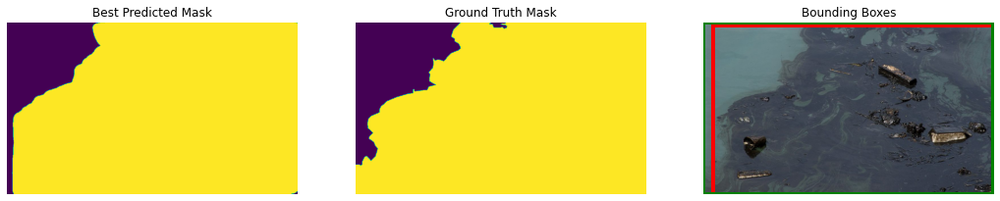

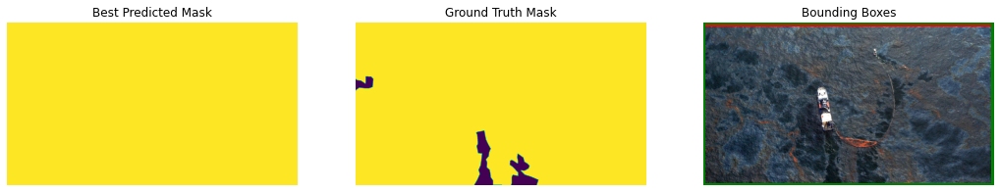

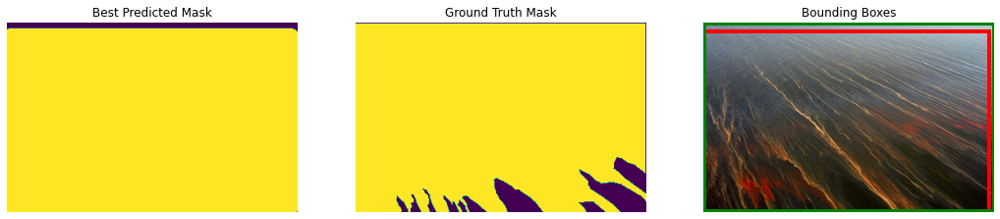

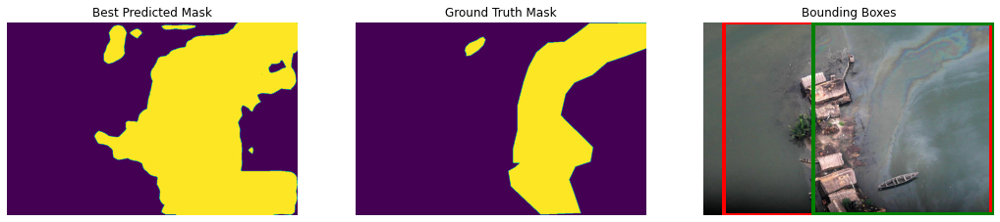

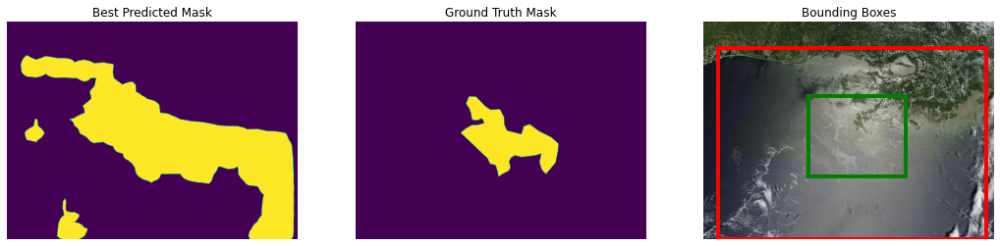

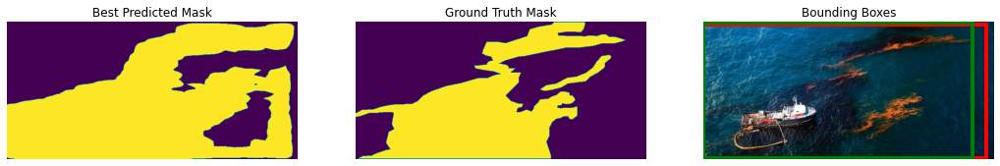

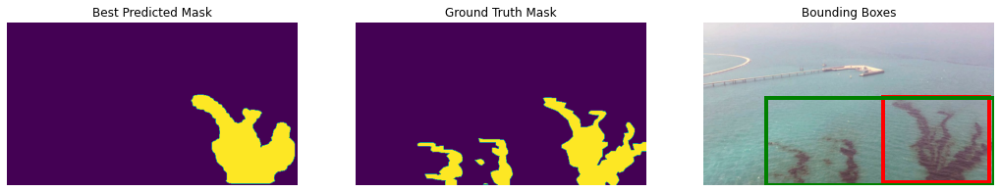

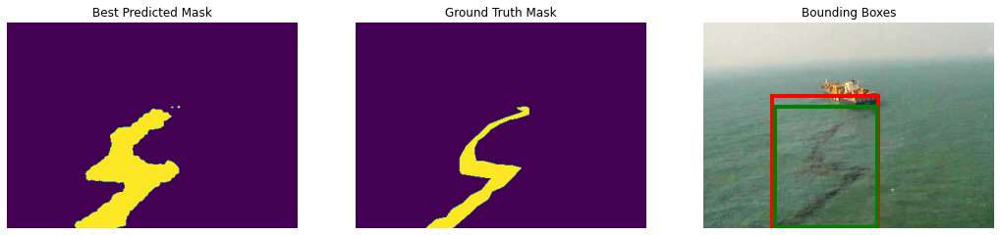

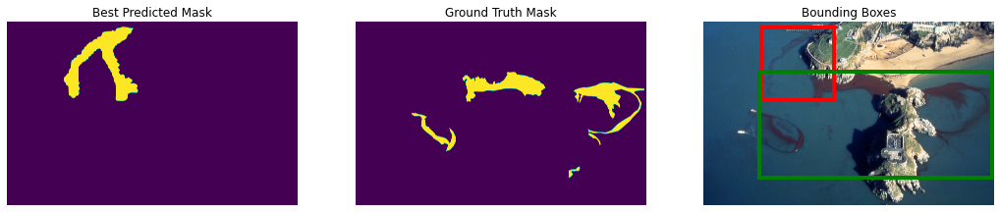

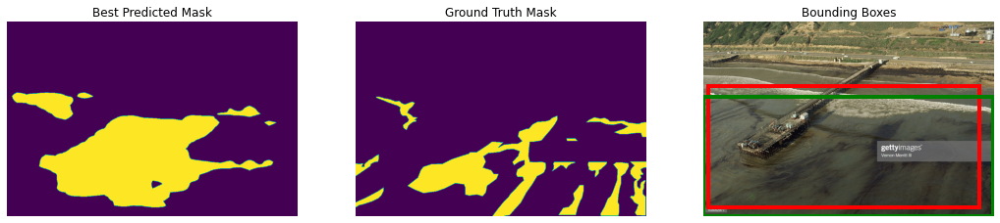

In [ ]:
for i, v in enumerate(traindata):
  img, mask_data = v
  #img = img[0]
  if i < 10:
    model.eval()
    with torch.no_grad():
        prediction = model([img.to(config.device)])
        im = Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())
        mask = Image.fromarray(prediction[0]['masks'][0, 0].mul(255).byte().cpu().numpy())
        im.show()
        mask.show()

        best_masks = prediction[0]['masks']

        # Create figure and axes
        fig, ax = plt.subplots(1,3, figsize=(18, 6))

        # # Create a Rectangle patch
        concat_mask = deepcopy(best_masks[0]) > 0.1

        for best_mask in best_masks[:1]:
          temp_mask = deepcopy(best_mask) > 0.1
          concat_mask = torch.logical_or(concat_mask, temp_mask)
          #concat_mask += best_mask
        ax[0].imshow(concat_mask.permute(1, 2, 0).squeeze(-1).cpu().numpy())
        ax[0].set_title('Best Predicted Mask')
        ax[0].axis('off')
        ax[1].imshow(mask_data['masks'].permute(1, 2, 0).squeeze(-1).cpu().numpy())
        ax[1].set_title('Ground Truth Mask')
        ax[1].axis('off')

        best_box = prediction[0]['boxes'][0]
        gt_box = mask_data['boxes'][0]
        ax[2].imshow(img.mul(255).permute(1, 2, 0).byte().numpy())
        thickness = 4
        pred_rect = patches.Rectangle((best_box[0], best_box[1]), best_box[2] - best_box[0], best_box[3] - best_box[1], linewidth=thickness, edgecolor='r', facecolor='none')
        gt_rect = patches.Rectangle((gt_box[0], gt_box[1]), gt_box[2] - gt_box[0], gt_box[3] - gt_box[1], linewidth=thickness, edgecolor='g', facecolor='none')
        ax[2].add_patch(pred_rect)
        ax[2].add_patch(gt_rect)
        ax[2].set_title('Bounding Boxes')
        ax[2].axis('off')

        plt.show()
  else:
    break;

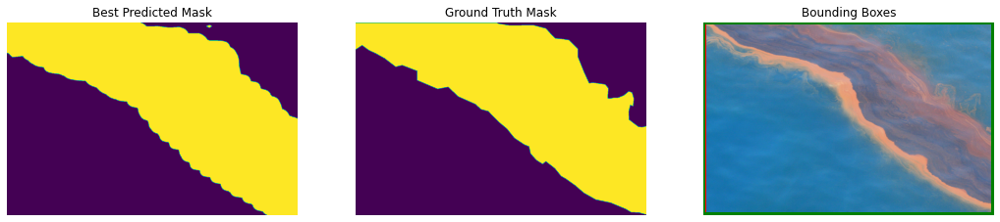

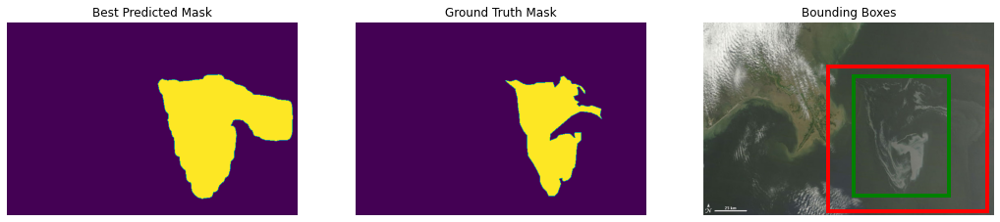

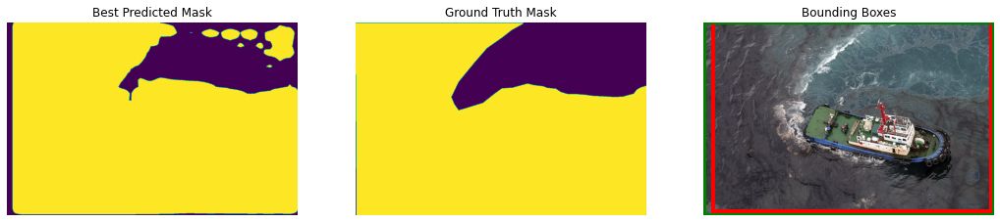

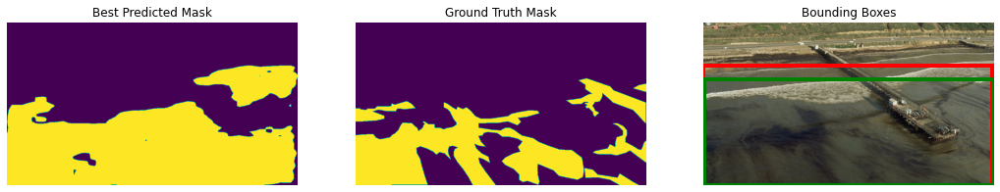

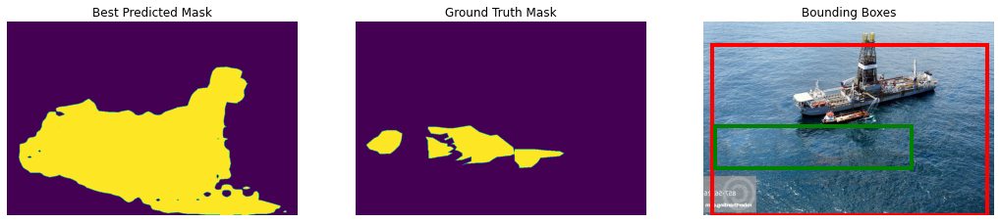

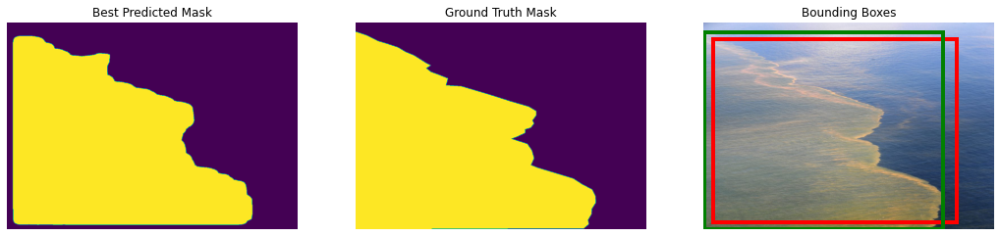

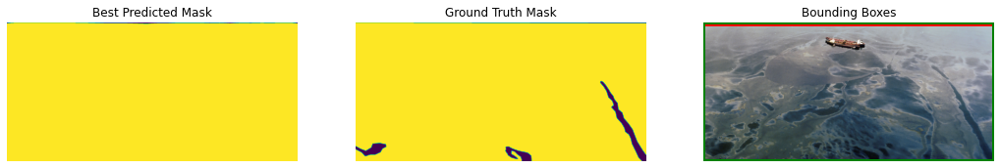

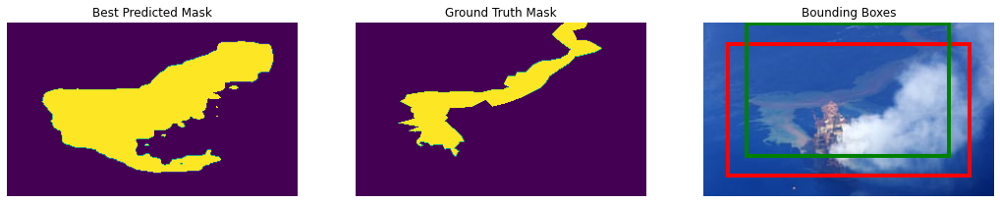

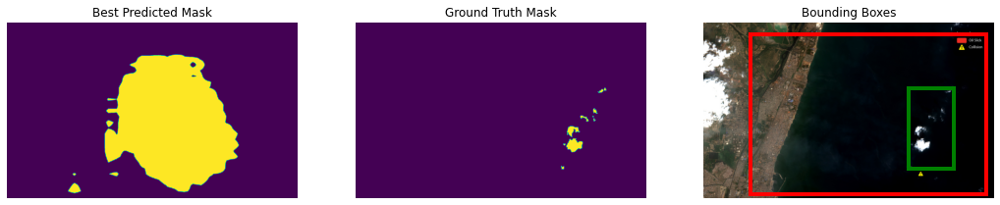

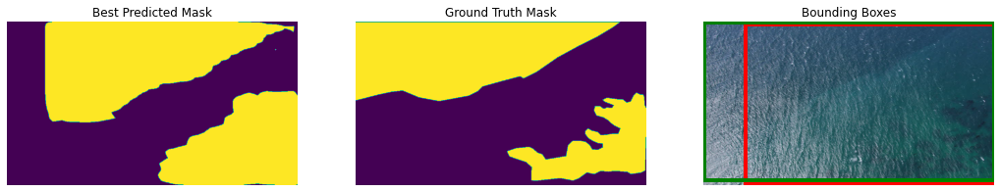

In [ ]:
for i, v in enumerate(valdata):
  img, mask_data = v
  #img = img[0]
  if i < 10:
    model.eval()
    with torch.no_grad():
        prediction = model([img.to(config.device)])
        im = Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())
        mask = Image.fromarray(prediction[0]['masks'][0, 0].mul(255).byte().cpu().numpy())
        im.show()
        mask.show()

        best_masks = prediction[0]['masks']

        # Create figure and axes
        fig, ax = plt.subplots(1,3, figsize=(18, 6))

        # # Create a Rectangle patch
        concat_mask = deepcopy(best_masks[0]) > 0.1

        for best_mask in best_masks[:1]:
          temp_mask = deepcopy(best_mask) > 0.1
          concat_mask = torch.logical_or(concat_mask, temp_mask)
          #concat_mask += best_mask
        ax[0].imshow(concat_mask.permute(1, 2, 0).squeeze(-1).cpu().numpy())
        ax[0].set_title('Best Predicted Mask')
        ax[0].axis('off')
        #ax[1].imshow(concat_mask.permute(1, 2, 0).squeeze(-1).cpu().numpy())
        #ax[1].set_title('top-2 Predicted Masks (concatenated)')
        #ax[1].axis('off')
        ax[1].imshow(mask_data['masks'].permute(1, 2, 0).squeeze(-1).cpu().numpy())
        ax[1].set_title('Ground Truth Mask')
        ax[1].axis('off')

        best_box = prediction[0]['boxes'][0]
        gt_box = mask_data['boxes'][0]
        ax[2].imshow(img.mul(255).permute(1, 2, 0).byte().numpy())
        thickness = 4
        pred_rect = patches.Rectangle((best_box[0], best_box[1]), best_box[2] - best_box[0], best_box[3] - best_box[1], linewidth=thickness, edgecolor='r', facecolor='none')
        gt_rect = patches.Rectangle((gt_box[0], gt_box[1]), gt_box[2] - gt_box[0], gt_box[3] - gt_box[1], linewidth=thickness, edgecolor='g', facecolor='none')
        ax[2].add_patch(pred_rect)
        ax[2].add_patch(gt_rect)
        ax[2].set_title('Bounding Boxes')
        ax[2].axis('off')

        plt.show()
  else:
    break;

# Video Classification Example

In [ ]:
root = '/gdrive/MyDrive/segmentation/'
imgs = list(sorted(os.listdir(os.path.join(root, "test_frames_1"))))
to_tensor = T.ToTensor()
for i, img_path in enumerate(imgs):
  if i >= 0:
    model.eval()
    with torch.no_grad():
        img = Image.open(root + 'test_frames_1/' + img_path).convert("RGB")
        img, _ = to_tensor(img)
        prediction = model([img.to(device)])
        im = Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())
        # mask = Image.fromarray(prediction[0]['masks'][0, 0].mul(255).byte().cpu().numpy())
        best_masks = prediction[0]['masks']
        concat_mask = deepcopy(best_masks[0])
        for best_mask in best_masks[:2]:
          concat_mask += best_mask
        mask = Image.fromarray(concat_mask[0].mul(255).byte().cpu().numpy())
        im_name = 'test_results_1/img%03d.png'%i
        mask = mask.save(root + im_name)

In [ ]:
import cv2
import numpy as np
import glob
root = '/gdrive/MyDrive/segmentation/'
img_array = []
for filename in glob.glob(root + 'test_results_1/*.png'):
    img = cv2.imread(filename)
    height, width, layers = img.shape
    size = (width,height)
    img_array.append(img)
 
 
out = cv2.VideoWriter(root + 'test_results_1/videos/segmentation.avi',cv2.VideoWriter_fourcc(*'DIVX'), 10, size)
 
for i in range(len(img_array)):
    out.write(img_array[i])
out.release()

In [ ]:
root = '/gdrive/MyDrive/segmentation/'
imgs = list(sorted(os.listdir(os.path.join(root, "test_frames_2"))))
to_tensor = T.ToTensor()
for i, img_path in enumerate(imgs):
  if i >= 0:
    model.eval()
    with torch.no_grad():
        img = Image.open(root + 'test_frames_2/' + img_path).convert("RGB")
        img, _ = to_tensor(img)
        prediction = model([img.to(device)])
        im = Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())
        # mask = Image.fromarray(prediction[0]['masks'][0, 0].mul(255).byte().cpu().numpy())
        best_masks = prediction[0]['masks']
        concat_mask = deepcopy(best_masks[0])
        for best_mask in best_masks[:2]:
          concat_mask += best_mask
        mask = Image.fromarray(concat_mask[0].mul(255).byte().cpu().numpy())
        im_name = 'test_results_2/img%03d.png'%i
        mask = mask.save(root + im_name)

In [ ]:
import cv2
import numpy as np
import glob
root = '/gdrive/MyDrive/segmentation/'
img_array = []
for filename in glob.glob(root + 'test_results_2/*.png'):
    img = cv2.imread(filename)
    height, width, layers = img.shape
    size = (width,height)
    img_array.append(img)
 
 
out = cv2.VideoWriter(root + 'test_results_2/videos/segmentation.avi',cv2.VideoWriter_fourcc(*'DIVX'), 10, size)
 
for i in range(len(img_array)):
    out.write(img_array[i])
out.release()

# Hyperparameter Sweeping

In [ ]:
root = '/gdrive/MyDrive/segmentation/NAFTA Dataset/training'
data = OilSpillDataset(root, get_transform(train=True))
n = len(data)
trainsplit = int(0.7*n)

traindata, valdata = torch.utils.data.random_split(dataset=data, 
                                                   lengths=(trainsplit, n - trainsplit), 
                                                   generator=torch.Generator().manual_seed(42))

In [ ]:
# perform a bayesian sweep
sweep_config = {
    'method': 'bayes'
    }

# define our sweep to maximize segmentation MaP
metric = {
    'name': 'segm_mAP',
    'goal': 'maximize'   
    }
sweep_config['metric'] = metric

# define hyperparameters to optimize and region of search
parameters_dict = {
    'optimizer': {
        'values': ['adam', 'sgd']
        },
    'batch_size': {
        'values': [1, 2, 4, 6]
        }
    }
parameters_dict.update({
    'epochs': {
        'value': 10}
    })

parameters_dict.update({
    'learning_rate': {
        # a flat distribution between 0 and 0.1
        'distribution': 'uniform',
        'min': 0,
        'max': 0.1
      },
    'momentum': {
        # a flat distribution between 0 and 0.1
        'distribution': 'uniform',
        'min': 0,
        'max': 0.99,
      }
    })
sweep_config['parameters'] = parameters_dict

In [ ]:
sweep_id = wandb.sweep(sweep_config, project='semseg_demo')

Create sweep with ID: 61u7qy13
Sweep URL: https://wandb.ai/geande/semseg_demo/sweeps/61u7qy13


In [ ]:
hyperparameter_defaults = dict(
    framework="pytorch",
    batch_size=4,
    epochs=10,
    learning_rate=0.001,
    momentum=0.6,
    weight_decay=0.0005,
    optimizer="sgd",
    device=torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
    )

In [ ]:
def train(config=hyperparameter_defaults):
    # Initialize a new wandb run
    with wandb.init(config=config):
        config = wandb.config
        train_loader = torch.utils.data.DataLoader(traindata, batch_size=config.batch_size, shuffle=True, num_workers=0,
                                           collate_fn=utils.collate_fn)

        val_loader = torch.utils.data.DataLoader(valdata, batch_size=config.batch_size, shuffle=False, num_workers=0,
                                                collate_fn=utils.collate_fn)

        # get the model using our helper function
        model = get_model_instance_segmentation(num_classes=2)
        model.to(config.device)

        params = [p for p in model.parameters() if p.requires_grad]
        if config.optimizer == 'sgd':
            optimizer = torch.optim.SGD(params, lr=config.learning_rate,
                                        momentum=config.momentum, 
                                        weight_decay=config.weight_decay)
        elif config.optimizer == 'adam':
            optimizer = torch.optim.Adam(params, lr=config.learning_rate,
                                        weight_decay=config.weight_decay)
        
        lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=config.epochs)

        for epoch in range(config.epochs):
            # train for one epoch, printing every 10 iterations
            logger = train_one_epoch(model, optimizer, train_loader, config.device, epoch, print_freq=3)
            train_logged = train_logger(logger)
            # update the learning rate
            lr_scheduler.step()
            # evaluate on the test dataset
            eval_data = evaluate(model, val_loader, device=config.device)
            val_logged = val_logger(eval_data)
            train_logged.update(val_logged)
            train_logged.update({"epoch": epoch})
            wandb.log(train_logged)

In [ ]:
wandb.agent(sweep_id, train, count=20)

wandb: Agent Starting Run: s4dy9p5f with config:
wandb: 	batch_size: 4
wandb: 	epochs: 10
wandb: 	learning_rate: 0.053687846863721606
wandb: 	momentum: 0.33958367956747226
wandb: 	optimizer: adam
wandb: Currently logged in as: geande (use `wandb login --relogin` to force relogin)


/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Epoch: [0]  [ 0/72]  eta: 0:00:59  lr: 0.000809  loss: 3.4480 (3.4480)  loss_classifier: 0.8455 (0.8455)  loss_box_reg: 0.1046 (0.1046)  loss_mask: 2.4469 (2.4469)  loss_objectness: 0.0335 (0.0335)  loss_rpn_box_reg: 0.0176 (0.0176)  time: 0.8299  data: 0.1066  max mem: 4907
Epoch: [0]  [ 3/72]  eta: 0:01:50  lr: 0.003075  loss: 3.4480 (3.5167)  loss_classifier: 0.4055 (0.4556)  loss_box_reg: 0.0720 (0.0777)  loss_mask: 1.8972 (2.3591)  loss_objectness: 0.0335 (0.4433)  loss_rpn_box_reg: 0.0176 (0.1811)  time: 1.6010  data: 0.7981  max mem: 7792
Epoch: [0]  [ 6/72]  eta: 0:01:23  lr: 0.005342  loss: 4.5788 (253.9592)  loss_classifier: 0.8455 (181.2699)  loss_box_reg: 0.1046 (53.6065)  loss_mask: 2.4469 (15.2730)  loss_objectness: 1.6412 (2.4994)  loss_rpn_box_reg: 0.1673 (1.3105)  time: 1.2615  data: 0.5228  max mem: 7792
Epoch: [0]  [ 9/72]  eta: 0:01:10  lr: 0.007608  loss: 4.8499 (217.3082)  loss_classifier: 0.8455 (130.6614)  loss_box_reg: 0.2105 (53.4189)  loss_mask: 2.4469 (21.23

bbox_AR,▁▁▁▁▁▁▁▁▁▁
bbox_mAP,▁▁▁▁▁▁▁▁▁▁
epoch,▁▂▃▃▄▅▆▆▇█
loss,▁▂▄█▆▃▂▂▂▂
loss_box_reg,▁▂▄█▆▃▂▂▂▂
loss_classifier,█▁▁▁▁▁▁▁▁▁
loss_mask,▁▂▄█▆▃▂▂▂▂
loss_objectness,▁▁▂▅█▃▂▁▂▂
loss_rpn_box_reg,▁▁▂▄█▃▂▂▁▁
lr,▅█▇▇▆▅▃▂▂▁
segm_AR,▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 6pqvd9nu with config:
wandb: 	batch_size: 4
wandb: 	epochs: 10
wandb: 	learning_rate: 0.08678584904042358
wandb: 	momentum: 0.8734521793253446
wandb: 	optimizer: sgd


Epoch: [0]  [ 0/72]  eta: 0:00:58  lr: 0.001308  loss: 2.5029 (2.5029)  loss_classifier: 0.7920 (0.7920)  loss_box_reg: 0.0893 (0.0893)  loss_mask: 1.5253 (1.5253)  loss_objectness: 0.0618 (0.0618)  loss_rpn_box_reg: 0.0345 (0.0345)  time: 0.8193  data: 0.1376  max mem: 7809
Epoch: [0]  [ 3/72]  eta: 0:01:02  lr: 0.004971  loss: 2.5029 (2.7416)  loss_classifier: 0.3509 (0.5033)  loss_box_reg: 0.0784 (0.0840)  loss_mask: 1.5253 (2.0701)  loss_objectness: 0.0153 (0.0400)  loss_rpn_box_reg: 0.0404 (0.0442)  time: 0.9071  data: 0.2391  max mem: 7809
Epoch: [0]  [ 6/72]  eta: 0:01:05  lr: 0.008635  loss: 1.6433 (2.0459)  loss_classifier: 0.1302 (0.3220)  loss_box_reg: 0.0784 (0.0740)  loss_mask: 1.3905 (1.5621)  loss_objectness: 0.0520 (0.0436)  loss_rpn_box_reg: 0.0468 (0.0442)  time: 0.9935  data: 0.3023  max mem: 7809
Epoch: [0]  [ 9/72]  eta: 0:00:58  lr: 0.012298  loss: 1.2798 (1.8042)  loss_classifier: 0.1069 (0.2465)  loss_box_reg: 0.0732 (0.0682)  loss_mask: 1.0800 (1.3900)  loss_ob

wandb: Agent Starting Run: tk2qpup5 with config:
wandb: 	batch_size: 1
wandb: 	epochs: 10
wandb: 	learning_rate: 0.03954359367834531
wandb: 	momentum: 0.023943423746198192
wandb: 	optimizer: adam


Epoch: [0]  [  0/287]  eta: 0:01:10  lr: 0.000178  loss: 3.9916 (3.9916)  loss_classifier: 0.6299 (0.6299)  loss_box_reg: 0.1694 (0.1694)  loss_mask: 3.1871 (3.1871)  loss_objectness: 0.0018 (0.0018)  loss_rpn_box_reg: 0.0034 (0.0034)  time: 0.2462  data: 0.0370  max mem: 7809
Epoch: [0]  [  3/287]  eta: 0:01:18  lr: 0.000592  loss: 1.9665 (2.3676)  loss_classifier: 0.1171 (0.2716)  loss_box_reg: 0.0635 (0.0928)  loss_mask: 1.5645 (1.8909)  loss_objectness: 0.0335 (0.0468)  loss_rpn_box_reg: 0.0035 (0.0655)  time: 0.2747  data: 0.0843  max mem: 7809
Epoch: [0]  [  6/287]  eta: 0:01:08  lr: 0.001006  loss: 1.5960 (1.9122)  loss_classifier: 0.0821 (0.1812)  loss_box_reg: 0.0635 (0.0729)  loss_mask: 1.2558 (1.4575)  loss_objectness: 0.0581 (0.1328)  loss_rpn_box_reg: 0.0067 (0.0678)  time: 0.2454  data: 0.0587  max mem: 7809
Epoch: [0]  [  9/287]  eta: 0:01:04  lr: 0.001421  loss: 1.4541 (1.7403)  loss_classifier: 0.0547 (0.1364)  loss_box_reg: 0.0461 (0.0645)  loss_mask: 1.2088 (1.3430) 

bbox_AR,▁▁▁▁▁▁▁▁▁▁
bbox_mAP,▁▁▁▁▁▁▁▁▁▁
epoch,▁▂▃▃▄▅▆▆▇█
loss,▁▁▁▃▃▄█▂▂▂
loss_box_reg,▁▁▁▃▄▃█▂▂▂
loss_classifier,█▁▁▁▁▁▁▁▁▁
loss_mask,▁▁▁▃▃▄█▂▂▂
loss_objectness,▁▁▁▂▄▄█▁▁▁
loss_rpn_box_reg,▁▁▁▂▄▃█▁▁▁
lr,▅█▇▇▆▅▃▂▂▁
segm_AR,▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: x4hscyxo with config:
wandb: 	batch_size: 4
wandb: 	epochs: 10
wandb: 	learning_rate: 0.05159235537536531
wandb: 	momentum: 0.5178471801291334
wandb: 	optimizer: adam


Epoch: [0]  [ 0/72]  eta: 0:01:05  lr: 0.000778  loss: 5.8718 (5.8718)  loss_classifier: 0.7783 (0.7783)  loss_box_reg: 0.0542 (0.0542)  loss_mask: 4.8894 (4.8894)  loss_objectness: 0.0889 (0.0889)  loss_rpn_box_reg: 0.0609 (0.0609)  time: 0.9043  data: 0.0943  max mem: 7809
Epoch: [0]  [ 3/72]  eta: 0:01:18  lr: 0.002955  loss: 5.8718 (16.9716)  loss_classifier: 0.3868 (1.6563)  loss_box_reg: 0.0749 (0.2873)  loss_mask: 4.8894 (13.2669)  loss_objectness: 0.0889 (1.3723)  loss_rpn_box_reg: 0.0948 (0.3887)  time: 1.1361  data: 0.3612  max mem: 7901
Epoch: [0]  [ 6/72]  eta: 0:01:17  lr: 0.005133  loss: 11.0614 (22.9253)  loss_classifier: 0.5005 (1.6838)  loss_box_reg: 0.2036 (0.4811)  loss_mask: 4.8894 (9.7719)  loss_objectness: 2.8554 (10.4149)  loss_rpn_box_reg: 0.1845 (0.5736)  time: 1.1715  data: 0.4412  max mem: 7901
Epoch: [0]  [ 9/72]  eta: 0:01:06  lr: 0.007311  loss: 11.0614 (1542.2957)  loss_classifier: 0.7783 (366.4060)  loss_box_reg: 0.6047 (904.8571)  loss_mask: 4.4093 (164

bbox_AR,▁▁▁▁▁▁▁▁▁▁
bbox_mAP,▁▁▁▁▁▁▁▁▁▁
epoch,▁▂▃▃▄▅▆▆▇█
loss,▁▂▄▁▃▃▅█▃▃
loss_box_reg,▁▂▄▁▄▃▅█▃▃
loss_classifier,▁▁▁▁▇█▁▁▁▁
loss_mask,▁▂▄▁▃▃▅█▃▃
loss_objectness,▁▂▃▁▃▃▄█▃▂
loss_rpn_box_reg,▁▂▂▁▃▆▃█▂▂
lr,▅█▇▇▆▄▃▂▂▁
segm_AR,▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 8ji8k1y5 with config:
wandb: 	batch_size: 2
wandb: 	epochs: 10
wandb: 	learning_rate: 0.014304933662020514
wandb: 	momentum: 0.6672496365790778
wandb: 	optimizer: adam


Epoch: [0]  [  0/144]  eta: 0:00:56  lr: 0.000114  loss: 6.2073 (6.2073)  loss_classifier: 0.4853 (0.4853)  loss_box_reg: 0.1346 (0.1346)  loss_mask: 5.5770 (5.5770)  loss_objectness: 0.0043 (0.0043)  loss_rpn_box_reg: 0.0062 (0.0062)  time: 0.3906  data: 0.0377  max mem: 7901
Epoch: [0]  [  3/144]  eta: 0:01:00  lr: 0.000414  loss: 1.6356 (3.6154)  loss_classifier: 0.0741 (0.2244)  loss_box_reg: 0.0191 (0.0632)  loss_mask: 1.0452 (3.1280)  loss_objectness: 0.0478 (0.1262)  loss_rpn_box_reg: 0.0622 (0.0736)  time: 0.4286  data: 0.0406  max mem: 7901
Epoch: [0]  [  6/144]  eta: 0:00:56  lr: 0.000714  loss: 1.2250 (2.5466)  loss_classifier: 0.0928 (0.1704)  loss_box_reg: 0.0863 (0.0974)  loss_mask: 1.0137 (2.1305)  loss_objectness: 0.0451 (0.0845)  loss_rpn_box_reg: 0.0622 (0.0637)  time: 0.4081  data: 0.0391  max mem: 7901
Epoch: [0]  [  9/144]  eta: 0:01:20  lr: 0.001014  loss: 1.2250 (2.2686)  loss_classifier: 0.1022 (0.1648)  loss_box_reg: 0.0711 (0.0823)  loss_mask: 0.8217 (1.8242) 

bbox_AR,▁▁▁▁▁▁▁▁▁▁
bbox_mAP,▁▁▁▁▁▁▁▁▁▁
epoch,▁▂▃▃▄▅▆▆▇█
loss,▁▁▁█▁▁▁▁▁▁
loss_box_reg,▁▁▂█▁▁▁▁▁▁
loss_classifier,▁▁▁█▁▁▁▁▁▁
loss_mask,▁▂█▁▁▁▁▁▁▁
loss_objectness,▂▁▁█▁▁▁▁▁▁
loss_rpn_box_reg,▁▁▃█▂▁▁▁▁▁
lr,▅█▇▇▆▅▃▂▂▁
segm_AR,▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: rbtm1x88 with config:
wandb: 	batch_size: 1
wandb: 	epochs: 10
wandb: 	learning_rate: 0.09614488968569122
wandb: 	momentum: 0.2265854220722279
wandb: 	optimizer: adam


Epoch: [0]  [  0/287]  eta: 0:01:10  lr: 0.000432  loss: 4.2507 (4.2507)  loss_classifier: 0.4363 (0.4363)  loss_box_reg: 0.0782 (0.0782)  loss_mask: 3.7003 (3.7003)  loss_objectness: 0.0256 (0.0256)  loss_rpn_box_reg: 0.0102 (0.0102)  time: 0.2453  data: 0.0491  max mem: 7901
Epoch: [0]  [  3/287]  eta: 0:01:01  lr: 0.001439  loss: 1.6231 (2.5311)  loss_classifier: 0.0575 (0.1432)  loss_box_reg: 0.0230 (0.0420)  loss_mask: 1.3855 (2.1540)  loss_objectness: 0.0817 (0.1229)  loss_rpn_box_reg: 0.0587 (0.0690)  time: 0.2162  data: 0.0375  max mem: 7901
Epoch: [0]  [  6/287]  eta: 0:00:58  lr: 0.002447  loss: 4.2507 (4.7850)  loss_classifier: 0.4363 (0.8978)  loss_box_reg: 0.0782 (0.3407)  loss_mask: 2.7235 (3.3350)  loss_objectness: 0.1198 (0.1522)  loss_rpn_box_reg: 0.0587 (0.0593)  time: 0.2079  data: 0.0279  max mem: 7901
Epoch: [0]  [  9/287]  eta: 0:00:58  lr: 0.003454  loss: 2.8979 (3.9727)  loss_classifier: 0.0600 (0.6784)  loss_box_reg: 0.0782 (0.3290)  loss_mask: 1.3855 (2.7586) 

bbox_AR,▁▁▁▁
bbox_mAP,▁▁▁▁
epoch,▁▃▆█
loss,▁▁▄█
loss_box_reg,▁▁▂█
loss_classifier,█▁▁▁
loss_mask,▁▁▄█
loss_objectness,▁▁▄█
loss_rpn_box_reg,▁▂▄█
lr,▁█▇▅
segm_AR,▁▁▁▁


wandb: Agent Starting Run: o5z5flj2 with config:
wandb: 	batch_size: 1
wandb: 	epochs: 10
wandb: 	learning_rate: 0.015927353711211824
wandb: 	momentum: 0.013230693056054016
wandb: 	optimizer: adam


Epoch: [0]  [  0/287]  eta: 0:01:15  lr: 0.000072  loss: 3.3566 (3.3566)  loss_classifier: 0.7097 (0.7097)  loss_box_reg: 0.0307 (0.0307)  loss_mask: 2.5474 (2.5474)  loss_objectness: 0.0203 (0.0203)  loss_rpn_box_reg: 0.0485 (0.0485)  time: 0.2639  data: 0.0573  max mem: 7901
Epoch: [0]  [  3/287]  eta: 0:01:03  lr: 0.000238  loss: 2.5716 (3.3602)  loss_classifier: 0.2005 (0.3774)  loss_box_reg: 0.0011 (0.0252)  loss_mask: 2.1196 (2.7835)  loss_objectness: 0.0127 (0.0551)  loss_rpn_box_reg: 0.0485 (0.1190)  time: 0.2243  data: 0.0333  max mem: 7901
Epoch: [0]  [  6/287]  eta: 0:01:00  lr: 0.000405  loss: 1.9372 (2.4889)  loss_classifier: 0.1186 (0.2386)  loss_box_reg: 0.0105 (0.0280)  loss_mask: 1.8511 (2.0053)  loss_objectness: 0.0393 (0.1189)  loss_rpn_box_reg: 0.0485 (0.0981)  time: 0.2147  data: 0.0310  max mem: 7901
Epoch: [0]  [  9/287]  eta: 0:00:59  lr: 0.000572  loss: 1.1669 (2.0085)  loss_classifier: 0.0423 (0.1803)  loss_box_reg: 0.0307 (0.0384)  loss_mask: 0.9596 (1.6098) 

bbox_AR,▁▁▁▁▁▁▁▁▁▁
bbox_mAP,▁▁▁▁▁▁▁▁▁▁
epoch,▁▂▃▃▄▅▆▆▇█
loss,▁▁▁█▆▂▂▁▁▁
loss_box_reg,▁▁▁█▇▃▂▁▁▁
loss_classifier,▁▁▁█▇▃▂▁▁▁
loss_mask,▁▁▁█▆▂▂▁▁▁
loss_objectness,▁▁▁█▇▃▂▂▂▂
loss_rpn_box_reg,▁▁▁█▆▃▂▂▂▂
lr,▅█▇▇▆▅▃▂▂▁
segm_AR,▁▁▁▁▁▁▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: lo7lo2ly with config:
wandb: 	batch_size: 1
wandb: 	epochs: 10
wandb: 	learning_rate: 0.039662771932839784
wandb: 	momentum: 0.08653223848042783
wandb: 	optimizer: sgd


Epoch: [0]  [  0/287]  eta: 0:01:03  lr: 0.000178  loss: 5.3025 (5.3025)  loss_classifier: 0.8557 (0.8557)  loss_box_reg: 0.0082 (0.0082)  loss_mask: 4.4130 (4.4130)  loss_objectness: 0.0240 (0.0240)  loss_rpn_box_reg: 0.0016 (0.0016)  time: 0.2217  data: 0.0292  max mem: 7901
Epoch: [0]  [  3/287]  eta: 0:01:04  lr: 0.000594  loss: 3.7441 (4.7362)  loss_classifier: 0.7791 (0.8207)  loss_box_reg: 0.0349 (0.0681)  loss_mask: 2.9381 (3.7770)  loss_objectness: 0.0071 (0.0221)  loss_rpn_box_reg: 0.0062 (0.0482)  time: 0.2272  data: 0.0451  max mem: 7901
Epoch: [0]  [  6/287]  eta: 0:01:01  lr: 0.001009  loss: 3.2899 (3.7706)  loss_classifier: 0.6553 (0.6871)  loss_box_reg: 0.0683 (0.0735)  loss_mask: 2.4146 (2.9385)  loss_objectness: 0.0171 (0.0212)  loss_rpn_box_reg: 0.0473 (0.0503)  time: 0.2186  data: 0.0378  max mem: 7901
Epoch: [0]  [  9/287]  eta: 0:01:08  lr: 0.001425  loss: 2.4380 (3.2264)  loss_classifier: 0.4698 (0.5790)  loss_box_reg: 0.0551 (0.0704)  loss_mask: 1.8673 (2.5018) 

bbox_AR,▁▃▄▆▇████▇
bbox_mAP,▁▄▄▅▆█████
epoch,▁▂▃▃▄▅▆▆▇█
loss,█▆▅▄▄▃▂▂▁▁
loss_box_reg,█▇▆▅▄▄▃▂▁▁
loss_classifier,█▄▄▃▃▂▂▂▁▁
loss_mask,█▆▅▄▄▃▃▂▁▁
loss_objectness,█▄▄▂▂▃▂▁▁▁
loss_rpn_box_reg,█▆▃▄▄▃▂▂▁▁
lr,▅█▇▇▆▄▃▂▂▁
segm_AR,▁▁▅▆▅▇▇▆█▇


wandb: Agent Starting Run: hxsgif6g with config:
wandb: 	batch_size: 1
wandb: 	epochs: 10
wandb: 	learning_rate: 0.03899523264235569
wandb: 	momentum: 0.2369518266057267
wandb: 	optimizer: sgd


Epoch: [0]  [  0/287]  eta: 0:01:25  lr: 0.000175  loss: 4.0650 (4.0650)  loss_classifier: 0.7924 (0.7924)  loss_box_reg: 0.0412 (0.0412)  loss_mask: 3.1029 (3.1029)  loss_objectness: 0.0143 (0.0143)  loss_rpn_box_reg: 0.1143 (0.1143)  time: 0.2981  data: 0.1055  max mem: 7901
Epoch: [0]  [  3/287]  eta: 0:01:05  lr: 0.000584  loss: 2.8337 (3.0100)  loss_classifier: 0.5648 (0.6347)  loss_box_reg: 0.0524 (0.0564)  loss_mask: 1.9271 (2.1667)  loss_objectness: 0.0143 (0.0708)  loss_rpn_box_reg: 0.0742 (0.0815)  time: 0.2293  data: 0.0480  max mem: 7901
Epoch: [0]  [  6/287]  eta: 0:01:06  lr: 0.000992  loss: 2.8337 (3.0676)  loss_classifier: 0.5138 (0.5165)  loss_box_reg: 0.0554 (0.0621)  loss_mask: 1.9271 (2.3280)  loss_objectness: 0.0408 (0.0982)  loss_rpn_box_reg: 0.0742 (0.0628)  time: 0.2361  data: 0.0577  max mem: 7901
Epoch: [0]  [  9/287]  eta: 0:01:03  lr: 0.001401  loss: 1.9259 (2.7062)  loss_classifier: 0.3757 (0.4329)  loss_box_reg: 0.0554 (0.0676)  loss_mask: 1.5488 (2.0700) 

bbox_AR,▅▁▃▄▅██▇▇▇
bbox_mAP,▃▁▃▃▄▇█▇█▇
epoch,▁▂▃▃▄▅▆▆▇█
loss,█▆▆▆▅▄▃▂▁▁
loss_box_reg,█▆▅▅▄▄▃▂▁▁
loss_classifier,█▃▃▃▃▂▂▂▁▁
loss_mask,█▇▇▆▆▄▃▂▂▁
loss_objectness,█▇▅▄▄▃▂▂▁▁
loss_rpn_box_reg,█▄▃▃▃▃▂▂▁▁
lr,▅█▇▇▆▅▃▂▂▁
segm_AR,▃▁▁▅▃█▇█▆█


wandb: Agent Starting Run: 3ehujfsh with config:
wandb: 	batch_size: 1
wandb: 	epochs: 10
wandb: 	learning_rate: 0.02205985242211459
wandb: 	momentum: 0.19775315221216055
wandb: 	optimizer: sgd


Epoch: [0]  [  0/287]  eta: 0:01:12  lr: 0.000099  loss: 3.8324 (3.8324)  loss_classifier: 0.6664 (0.6664)  loss_box_reg: 0.0727 (0.0727)  loss_mask: 3.0680 (3.0680)  loss_objectness: 0.0232 (0.0232)  loss_rpn_box_reg: 0.0021 (0.0021)  time: 0.2535  data: 0.0681  max mem: 7901
Epoch: [0]  [  3/287]  eta: 0:01:00  lr: 0.000330  loss: 3.8324 (4.0030)  loss_classifier: 0.6253 (0.6336)  loss_box_reg: 0.0727 (0.0790)  loss_mask: 3.0680 (3.2178)  loss_objectness: 0.0167 (0.0303)  loss_rpn_box_reg: 0.0189 (0.0424)  time: 0.2116  data: 0.0343  max mem: 7901
Epoch: [0]  [  6/287]  eta: 0:01:06  lr: 0.000561  loss: 2.9479 (3.3163)  loss_classifier: 0.5832 (0.5841)  loss_box_reg: 0.0781 (0.0973)  loss_mask: 2.2202 (2.5665)  loss_objectness: 0.0167 (0.0242)  loss_rpn_box_reg: 0.0189 (0.0442)  time: 0.2369  data: 0.0554  max mem: 7901
Epoch: [0]  [  9/287]  eta: 0:01:03  lr: 0.000793  loss: 2.9221 (3.0925)  loss_classifier: 0.5306 (0.5213)  loss_box_reg: 0.0781 (0.0935)  loss_mask: 2.1997 (2.4229) 

bbox_AR,█▃▂▆▄▄▅▁▄▄
bbox_mAP,▄▁▁▅▆▅█▆██
epoch,▁▂▃▃▄▅▆▆▇█
loss,█▅▄▄▃▃▂▂▁▁
loss_box_reg,█▆▅▄▄▃▂▂▁▁
loss_classifier,█▄▃▃▃▂▂▁▁▁
loss_mask,█▆▅▄▄▃▂▂▁▁
loss_objectness,█▄▃▂▃▂▁▁▁▁
loss_rpn_box_reg,█▆▅▄▄▃▃▂▁▁
lr,▅█▇▇▆▅▃▂▂▁
segm_AR,▄▃▂▁▆▇▇▄██


wandb: Agent Starting Run: vjtd25uc with config:
wandb: 	batch_size: 1
wandb: 	epochs: 10
wandb: 	learning_rate: 0.014451677329610935
wandb: 	momentum: 0.2843328624765539
wandb: 	optimizer: sgd


Epoch: [0]  [  0/287]  eta: 0:01:20  lr: 0.000065  loss: 8.2991 (8.2991)  loss_classifier: 0.8287 (0.8287)  loss_box_reg: 0.0522 (0.0522)  loss_mask: 6.9429 (6.9429)  loss_objectness: 0.2945 (0.2945)  loss_rpn_box_reg: 0.1808 (0.1808)  time: 0.2789  data: 0.0764  max mem: 7901
Epoch: [0]  [  3/287]  eta: 0:01:10  lr: 0.000216  loss: 4.8559 (5.3687)  loss_classifier: 0.7162 (0.7654)  loss_box_reg: 0.0656 (0.0758)  loss_mask: 3.9863 (4.3607)  loss_objectness: 0.0021 (0.0787)  loss_rpn_box_reg: 0.0457 (0.0880)  time: 0.2476  data: 0.0512  max mem: 7901
Epoch: [0]  [  6/287]  eta: 0:01:25  lr: 0.000368  loss: 4.6112 (4.3274)  loss_classifier: 0.7178 (0.7532)  loss_box_reg: 0.0719 (0.0730)  loss_mask: 3.6521 (3.3512)  loss_objectness: 0.0242 (0.0656)  loss_rpn_box_reg: 0.0980 (0.0845)  time: 0.3029  data: 0.1124  max mem: 7901
Epoch: [0]  [  9/287]  eta: 0:01:16  lr: 0.000519  loss: 3.1975 (3.7530)  loss_classifier: 0.6886 (0.6750)  loss_box_reg: 0.0673 (0.0768)  loss_mask: 2.3505 (2.8733) 

bbox_AR,▂▄▁▆█▆▇▇▇▆
bbox_mAP,▁▄▁▅█▆▇▇█▇
epoch,▁▂▃▃▄▅▆▆▇█
loss,█▅▄▄▃▂▂▁▁▁
loss_box_reg,█▅▅▄▃▃▂▂▁▁
loss_classifier,█▃▃▃▂▂▁▁▁▁
loss_mask,█▅▅▄▃▂▂▁▁▁
loss_objectness,█▄▃▂▂▁▁▁▁▁
loss_rpn_box_reg,█▇▅▅▄▄▃▂▁▁
lr,▅█▇▇▆▄▃▂▂▁
segm_AR,▃▁▃▂▄▁▆▇█▇


wandb: Agent Starting Run: 13doeooq with config:
wandb: 	batch_size: 1
wandb: 	epochs: 10
wandb: 	learning_rate: 0.008805631500823242
wandb: 	momentum: 0.3090073427791119
wandb: 	optimizer: sgd


Epoch: [0]  [  0/287]  eta: 0:01:02  lr: 0.000040  loss: 6.5095 (6.5095)  loss_classifier: 0.8294 (0.8294)  loss_box_reg: 0.0816 (0.0816)  loss_mask: 5.5000 (5.5000)  loss_objectness: 0.0306 (0.0306)  loss_rpn_box_reg: 0.0680 (0.0680)  time: 0.2174  data: 0.0380  max mem: 7901
Epoch: [0]  [  3/287]  eta: 0:01:06  lr: 0.000132  loss: 6.0437 (5.9171)  loss_classifier: 0.8294 (0.8681)  loss_box_reg: 0.0739 (0.0701)  loss_mask: 5.1309 (4.8993)  loss_objectness: 0.0306 (0.0470)  loss_rpn_box_reg: 0.0139 (0.0326)  time: 0.2343  data: 0.0548  max mem: 7901
Epoch: [0]  [  6/287]  eta: 0:01:22  lr: 0.000224  loss: 4.7365 (4.7473)  loss_classifier: 0.8294 (0.7978)  loss_box_reg: 0.0739 (0.0662)  loss_mask: 3.7789 (3.7645)  loss_objectness: 0.0591 (0.0659)  loss_rpn_box_reg: 0.0530 (0.0530)  time: 0.2926  data: 0.1087  max mem: 7901
Epoch: [0]  [  9/287]  eta: 0:02:16  lr: 0.000316  loss: 3.2060 (4.0706)  loss_classifier: 0.6863 (0.7410)  loss_box_reg: 0.0738 (0.0643)  loss_mask: 2.5041 (3.1577) 

bbox_AR,▄█▁▇▆▆▅▆█▆
bbox_mAP,▂▇▁▇▇▆▆▆█▇
epoch,▁▂▃▃▄▅▆▆▇█
loss,█▅▄▃▃▂▂▁▁▁
loss_box_reg,█▇▅▄▃▃▂▁▁▁
loss_classifier,█▃▃▂▂▂▁▁▁▁
loss_mask,█▅▄▃▃▂▂▁▁▁
loss_objectness,█▅▂▂▂▁▁▁▁▁
loss_rpn_box_reg,█▆▅▄▅▄▃▂▁▁
lr,▅█▇▇▆▅▃▂▂▁
segm_AR,▁▄▂██▅▇▇▇▇


wandb: Agent Starting Run: ztub6xav with config:
wandb: 	batch_size: 1
wandb: 	epochs: 10
wandb: 	learning_rate: 0.0214179576324274
wandb: 	momentum: 0.3319354491624578
wandb: 	optimizer: sgd


Epoch: [0]  [  0/287]  eta: 0:01:02  lr: 0.000096  loss: 4.1875 (4.1875)  loss_classifier: 0.9566 (0.9566)  loss_box_reg: 0.0312 (0.0312)  loss_mask: 3.0024 (3.0024)  loss_objectness: 0.0931 (0.0931)  loss_rpn_box_reg: 0.1042 (0.1042)  time: 0.2161  data: 0.0276  max mem: 7901
Epoch: [0]  [  3/287]  eta: 0:01:06  lr: 0.000321  loss: 4.1875 (4.7617)  loss_classifier: 0.8758 (0.8349)  loss_box_reg: 0.0643 (0.0624)  loss_mask: 3.1445 (3.7632)  loss_objectness: 0.0578 (0.0665)  loss_rpn_box_reg: 0.0072 (0.0346)  time: 0.2348  data: 0.0591  max mem: 7901
Epoch: [0]  [  6/287]  eta: 0:01:13  lr: 0.000545  loss: 4.1245 (3.7734)  loss_classifier: 0.7353 (0.7428)  loss_box_reg: 0.0875 (0.0893)  loss_mask: 3.0024 (2.8569)  loss_objectness: 0.0123 (0.0402)  loss_rpn_box_reg: 0.0226 (0.0441)  time: 0.2622  data: 0.0817  max mem: 7901
Epoch: [0]  [  9/287]  eta: 0:01:10  lr: 0.000770  loss: 2.4007 (3.2254)  loss_classifier: 0.6086 (0.6553)  loss_box_reg: 0.0677 (0.0830)  loss_mask: 1.6685 (2.4164) 

bbox_AR,▁▄▁▇▇█▇█▇▇
bbox_mAP,▁▃▂▅▆▇▇█▇▇
epoch,▁▂▃▃▄▅▆▆▇█
loss,█▇▅▅▄▃▃▂▁▁
loss_box_reg,█▇▆▄▄▃▃▂▁▁
loss_classifier,█▄▃▃▂▂▂▂▁▁
loss_mask,█▇▆▅▄▃▃▂▁▁
loss_objectness,▅█▅▃▂▂▁▁▁▁
loss_rpn_box_reg,█▆▅▅▄▄▃▂▁▁
lr,▅█▇▇▆▄▃▂▂▁
segm_AR,▄▁▂▆▇▇▆█▇▇


wandb: Agent Starting Run: qrq3ouwv with config:
wandb: 	batch_size: 1
wandb: 	epochs: 10
wandb: 	learning_rate: 0.03505370510906027
wandb: 	momentum: 0.4252383280107149
wandb: 	optimizer: sgd


Epoch: [0]  [  0/287]  eta: 0:00:52  lr: 0.000157  loss: 16.5902 (16.5902)  loss_classifier: 0.8407 (0.8407)  loss_box_reg: 0.1387 (0.1387)  loss_mask: 15.5823 (15.5823)  loss_objectness: 0.0060 (0.0060)  loss_rpn_box_reg: 0.0224 (0.0224)  time: 0.1817  data: 0.0133  max mem: 7901
Epoch: [0]  [  3/287]  eta: 0:01:05  lr: 0.000525  loss: 4.6049 (9.7103)  loss_classifier: 0.8407 (0.8794)  loss_box_reg: 0.0951 (0.0891)  loss_mask: 3.6016 (8.6354)  loss_objectness: 0.0060 (0.0165)  loss_rpn_box_reg: 0.0239 (0.0899)  time: 0.2306  data: 0.0593  max mem: 7901
Epoch: [0]  [  6/287]  eta: 0:01:06  lr: 0.000892  loss: 4.6049 (6.8115)  loss_classifier: 0.7549 (0.6979)  loss_box_reg: 0.0951 (0.0699)  loss_mask: 3.6016 (5.9135)  loss_objectness: 0.0120 (0.0231)  loss_rpn_box_reg: 0.0885 (0.1071)  time: 0.2357  data: 0.0653  max mem: 7901
Epoch: [0]  [  9/287]  eta: 0:01:06  lr: 0.001259  loss: 2.1462 (5.2270)  loss_classifier: 0.4552 (0.5620)  loss_box_reg: 0.0208 (0.0595)  loss_mask: 1.4469 (4.45

wandb: Agent Starting Run: ihrse126 with config:
wandb: 	batch_size: 2
wandb: 	epochs: 10
wandb: 	learning_rate: 0.032862704038166726
wandb: 	momentum: 0.16572616512602564
wandb: 	optimizer: sgd


Epoch: [0]  [  0/144]  eta: 0:00:59  lr: 0.000262  loss: 6.2421 (6.2421)  loss_classifier: 0.5267 (0.5267)  loss_box_reg: 0.0299 (0.0299)  loss_mask: 5.5863 (5.5863)  loss_objectness: 0.0506 (0.0506)  loss_rpn_box_reg: 0.0486 (0.0486)  time: 0.4146  data: 0.0787  max mem: 7901
Epoch: [0]  [  3/144]  eta: 0:00:59  lr: 0.000951  loss: 4.6542 (5.2332)  loss_classifier: 0.4867 (0.5117)  loss_box_reg: 0.0423 (0.0630)  loss_mask: 3.9490 (4.5716)  loss_objectness: 0.0127 (0.0566)  loss_rpn_box_reg: 0.0188 (0.0303)  time: 0.4219  data: 0.0746  max mem: 7901
Epoch: [0]  [  6/144]  eta: 0:01:12  lr: 0.001640  loss: 3.6749 (3.8415)  loss_classifier: 0.4408 (0.4411)  loss_box_reg: 0.0551 (0.0623)  loss_mask: 3.0920 (3.2339)  loss_objectness: 0.0439 (0.0613)  loss_rpn_box_reg: 0.0456 (0.0430)  time: 0.5278  data: 0.1727  max mem: 7901
Epoch: [0]  [  9/144]  eta: 0:01:08  lr: 0.002329  loss: 2.1167 (3.0768)  loss_classifier: 0.3355 (0.3669)  loss_box_reg: 0.0539 (0.0616)  loss_mask: 1.5535 (2.5427) 

bbox_AR,▁█▇▇▆▆▇▇█▇
bbox_mAP,▁██▇▆▇▇███
epoch,▁▂▃▃▄▅▆▆▇█
loss,█▅▄▄▃▂▂▂▁▁
loss_box_reg,█▇▄▄▃▃▂▂▁▁
loss_classifier,█▄▃▃▃▂▂▁▁▁
loss_mask,█▅▄▄▃▂▂▂▁▁
loss_objectness,█▄▂▂▂▁▁▁▁▁
loss_rpn_box_reg,█▆▄▅▄▃▃▂▁▁
lr,▅█▇▇▆▅▃▂▂▁
segm_AR,▁▃▇▄▆▇▆███


wandb: Agent Starting Run: gz7thsqy with config:
wandb: 	batch_size: 2
wandb: 	epochs: 10
wandb: 	learning_rate: 0.017673670351469863
wandb: 	momentum: 0.2989597935964512
wandb: 	optimizer: sgd


Epoch: [0]  [  0/144]  eta: 0:00:54  lr: 0.000141  loss: 3.3552 (3.3552)  loss_classifier: 0.7137 (0.7137)  loss_box_reg: 0.0795 (0.0795)  loss_mask: 2.4481 (2.4481)  loss_objectness: 0.0325 (0.0325)  loss_rpn_box_reg: 0.0815 (0.0815)  time: 0.3805  data: 0.0385  max mem: 7901
Epoch: [0]  [  3/144]  eta: 0:00:57  lr: 0.000512  loss: 2.1728 (2.5185)  loss_classifier: 0.6320 (0.6727)  loss_box_reg: 0.0850 (0.0978)  loss_mask: 1.3252 (1.6589)  loss_objectness: 0.0325 (0.0488)  loss_rpn_box_reg: 0.0193 (0.0403)  time: 0.4063  data: 0.0631  max mem: 7901
Epoch: [0]  [  6/144]  eta: 0:00:56  lr: 0.000882  loss: 2.6416 (2.6972)  loss_classifier: 0.6042 (0.5655)  loss_box_reg: 0.0850 (0.0963)  loss_mask: 1.7330 (1.9259)  loss_objectness: 0.0543 (0.0624)  loss_rpn_box_reg: 0.0574 (0.0472)  time: 0.4111  data: 0.0657  max mem: 7901
Epoch: [0]  [  9/144]  eta: 0:01:01  lr: 0.001252  loss: 1.9703 (2.3483)  loss_classifier: 0.4415 (0.4767)  loss_box_reg: 0.0795 (0.0877)  loss_mask: 1.3252 (1.6772) 

bbox_AR,▃▆▁▅▃▅▅▆█▇
bbox_mAP,▁▄▁▅▅▅▆▆██
epoch,▁▂▃▃▄▅▆▆▇█
loss,█▅▄▃▃▂▂▁▁▁
loss_box_reg,█▇▅▄▃▃▂▁▁▁
loss_classifier,█▃▃▃▂▂▁▁▁▁
loss_mask,█▅▅▄▃▂▂▁▁▁
loss_objectness,█▄▃▂▂▂▁▁▁▁
loss_rpn_box_reg,█▇▅▄▄▃▃▁▁▁
lr,▅█▇▇▆▅▃▂▂▁
segm_AR,▁▅▄▆▆▅▆██▆


wandb: Agent Starting Run: lqucrj6r with config:
wandb: 	batch_size: 2
wandb: 	epochs: 10
wandb: 	learning_rate: 0.01678901386041658
wandb: 	momentum: 0.274036483205612
wandb: 	optimizer: sgd


Epoch: [0]  [  0/144]  eta: 0:01:23  lr: 0.000134  loss: 12.1744 (12.1744)  loss_classifier: 1.1226 (1.1226)  loss_box_reg: 0.0533 (0.0533)  loss_mask: 10.7710 (10.7710)  loss_objectness: 0.1276 (0.1276)  loss_rpn_box_reg: 0.0998 (0.0998)  time: 0.5800  data: 0.0886  max mem: 7901
Epoch: [0]  [  3/144]  eta: 0:01:20  lr: 0.000486  loss: 7.3730 (7.9366)  loss_classifier: 1.0994 (1.1245)  loss_box_reg: 0.0533 (0.0683)  loss_mask: 6.1863 (6.6194)  loss_objectness: 0.0233 (0.0667)  loss_rpn_box_reg: 0.0295 (0.0576)  time: 0.5734  data: 0.1677  max mem: 7901
Epoch: [0]  [  6/144]  eta: 0:01:13  lr: 0.000838  loss: 3.7652 (5.4611)  loss_classifier: 1.0822 (0.9205)  loss_box_reg: 0.0749 (0.0804)  loss_mask: 2.5232 (4.3525)  loss_objectness: 0.0451 (0.0608)  loss_rpn_box_reg: 0.0295 (0.0469)  time: 0.5361  data: 0.1535  max mem: 7901
Epoch: [0]  [  9/144]  eta: 0:01:17  lr: 0.001190  loss: 2.0291 (4.2992)  loss_classifier: 0.6119 (0.7580)  loss_box_reg: 0.0683 (0.0782)  loss_mask: 1.3101 (3.37

bbox_AR,▁▅▅▆▇▇██▇█
bbox_mAP,▁▅▅▆▇█▇█▇▇
epoch,▁▂▃▃▄▅▆▆▇█
loss,█▅▄▃▃▂▂▁▁▁
loss_box_reg,█▇▄▄▃▂▂▂▁▁
loss_classifier,█▃▂▂▂▁▁▁▁▁
loss_mask,█▅▄▃▃▂▂▁▁▁
loss_objectness,█▄▂▂▂▁▁▁▁▁
loss_rpn_box_reg,█▆▅▄▅▄▃▂▁▁
lr,▅█▇▇▆▅▃▂▂▁
segm_AR,▁▅▆▆█▇▇▇█▇


wandb: Agent Starting Run: wwc36gtj with config:
wandb: 	batch_size: 2
wandb: 	epochs: 10
wandb: 	learning_rate: 0.014760426704045685
wandb: 	momentum: 0.29897887278934165
wandb: 	optimizer: sgd


Epoch: [0]  [  0/144]  eta: 0:01:10  lr: 0.000118  loss: 6.1132 (6.1132)  loss_classifier: 0.5842 (0.5842)  loss_box_reg: 0.1055 (0.1055)  loss_mask: 5.2886 (5.2886)  loss_objectness: 0.0880 (0.0880)  loss_rpn_box_reg: 0.0469 (0.0469)  time: 0.4900  data: 0.1404  max mem: 7901
Epoch: [0]  [  3/144]  eta: 0:00:59  lr: 0.000427  loss: 4.6055 (5.5488)  loss_classifier: 0.5842 (0.5948)  loss_box_reg: 0.0600 (0.0731)  loss_mask: 3.9302 (4.7465)  loss_objectness: 0.0738 (0.0919)  loss_rpn_box_reg: 0.0374 (0.0425)  time: 0.4203  data: 0.0600  max mem: 7901
Epoch: [0]  [  6/144]  eta: 0:01:17  lr: 0.000737  loss: 4.4261 (4.3551)  loss_classifier: 0.5306 (0.5322)  loss_box_reg: 0.0600 (0.0700)  loss_mask: 3.6633 (3.6287)  loss_objectness: 0.0738 (0.0789)  loss_rpn_box_reg: 0.0469 (0.0454)  time: 0.5623  data: 0.2029  max mem: 7901
Epoch: [0]  [  9/144]  eta: 0:01:16  lr: 0.001046  loss: 2.9116 (3.5797)  loss_classifier: 0.4502 (0.4590)  loss_box_reg: 0.0600 (0.0743)  loss_mask: 2.2413 (2.9361) 

bbox_AR,▁▁▆▄▇█▅█▇▇
bbox_mAP,▁▂▇▅▇█▇███
epoch,▁▂▃▃▄▅▆▆▇█
loss,█▅▄▄▃▂▂▁▁▁
loss_box_reg,██▆▅▄▃▂▂▁▁
loss_classifier,█▃▃▃▂▂▁▁▁▁
loss_mask,█▅▄▄▃▂▂▁▁▁
loss_objectness,██▄▂▂▂▁▁▁▁
loss_rpn_box_reg,█▇▆▄▃▃▂▁▁▁
lr,▅█▇▇▆▄▃▂▂▁
segm_AR,▁▃▇▅█▇▇▇▇▇


wandb: Agent Starting Run: 9zfcd7td with config:
wandb: 	batch_size: 2
wandb: 	epochs: 10
wandb: 	learning_rate: 0.0022435628103512294
wandb: 	momentum: 0.29104492267124643
wandb: 	optimizer: sgd


Epoch: [0]  [  0/144]  eta: 0:01:08  lr: 0.000018  loss: 4.3085 (4.3085)  loss_classifier: 0.8723 (0.8723)  loss_box_reg: 0.0766 (0.0766)  loss_mask: 3.1955 (3.1955)  loss_objectness: 0.0350 (0.0350)  loss_rpn_box_reg: 0.1290 (0.1290)  time: 0.4783  data: 0.1062  max mem: 7901
Epoch: [0]  [  3/144]  eta: 0:01:17  lr: 0.000065  loss: 3.5751 (4.1972)  loss_classifier: 0.7904 (0.8105)  loss_box_reg: 0.0766 (0.0820)  loss_mask: 2.6037 (3.1469)  loss_objectness: 0.0342 (0.0884)  loss_rpn_box_reg: 0.0578 (0.0694)  time: 0.5520  data: 0.1776  max mem: 7901
Epoch: [0]  [  6/144]  eta: 0:01:32  lr: 0.000112  loss: 3.7023 (3.8795)  loss_classifier: 0.7904 (0.7878)  loss_box_reg: 0.0627 (0.0671)  loss_mask: 2.7309 (2.8856)  loss_objectness: 0.0350 (0.0854)  loss_rpn_box_reg: 0.0578 (0.0536)  time: 0.6724  data: 0.3031  max mem: 7901
Epoch: [0]  [  9/144]  eta: 0:01:25  lr: 0.000159  loss: 3.5751 (3.6087)  loss_classifier: 0.7552 (0.7367)  loss_box_reg: 0.0695 (0.0736)  loss_mask: 2.6037 (2.6717) 

bbox_AR,▁▅▇▃▆▇▆███
bbox_mAP,▁▅▇▆▇▇▇███
epoch,▁▂▃▃▄▅▆▆▇█
loss,█▄▃▂▂▂▁▁▁▁
loss_box_reg,▄▇█▇▅▄▃▂▁▁
loss_classifier,█▂▂▂▁▁▁▁▁▁
loss_mask,█▄▃▂▂▂▁▁▁▁
loss_objectness,█▃▂▂▁▁▁▁▁▁
loss_rpn_box_reg,█▅▃▃▂▂▂▁▁▁
lr,▅█▇▇▆▅▃▂▂▁
segm_AR,▁▃▆▂▄█▄█▇▆


wandb: Agent Starting Run: xvq2ttgq with config:
wandb: 	batch_size: 2
wandb: 	epochs: 10
wandb: 	learning_rate: 0.03718912778085761
wandb: 	momentum: 0.13786086683691087
wandb: 	optimizer: sgd


Epoch: [0]  [  0/144]  eta: 0:00:57  lr: 0.000297  loss: 4.5401 (4.5401)  loss_classifier: 0.4358 (0.4358)  loss_box_reg: 0.0387 (0.0387)  loss_mask: 3.7040 (3.7040)  loss_objectness: 0.2620 (0.2620)  loss_rpn_box_reg: 0.0996 (0.0996)  time: 0.4007  data: 0.0496  max mem: 7901
Epoch: [0]  [  3/144]  eta: 0:01:01  lr: 0.001076  loss: 2.7671 (3.4034)  loss_classifier: 0.4351 (0.4477)  loss_box_reg: 0.0432 (0.0594)  loss_mask: 2.1695 (2.7380)  loss_objectness: 0.0539 (0.1034)  loss_rpn_box_reg: 0.0547 (0.0550)  time: 0.4346  data: 0.0848  max mem: 7901
Epoch: [0]  [  6/144]  eta: 0:01:39  lr: 0.001856  loss: 2.5620 (2.7129)  loss_classifier: 0.3884 (0.3759)  loss_box_reg: 0.0716 (0.0667)  loss_mask: 1.9679 (2.1528)  loss_objectness: 0.0511 (0.0748)  loss_rpn_box_reg: 0.0384 (0.0428)  time: 0.7189  data: 0.3538  max mem: 7901
Epoch: [0]  [  9/144]  eta: 0:01:28  lr: 0.002635  loss: 2.0701 (2.4541)  loss_classifier: 0.2523 (0.3197)  loss_box_reg: 0.0715 (0.0734)  loss_mask: 1.5988 (1.9519) 

[First Hyperparameter Sweep](https://https://wandb.ai/geande/semseg_demo/sweeps/61u7qy13?workspace=user-geande)

In [ ]:
# perform a bayesian sweep
sweep_config = {
    'method': 'bayes'
    }

# define our sweep to maximize segmentation MaP
metric = {
    'name': 'segm_mAP',
    'goal': 'maximize'   
    }
sweep_config['metric'] = metric

# define hyperparameters to optimize and region of search
parameters_dict = {
    'epochs': {
        'values': [10, 15, 20]
        },
    'batch_size': {
        'values': [1, 2]
    }
    }

parameters_dict.update({
    'learning_rate': {
        # a flat distribution between 0 and 0.1
        'distribution': 'uniform',
        'min': 0,
        'max': 0.1
      },
    'momentum': {
        # a flat distribution between 0 and 0.99
        'distribution': 'uniform',
        'min': 0,
        'max': 0.99,
      },
    'weight_decay': {
        # a flat distribution between 0 and 0.01
        'distribution': 'uniform',
        'min': 0,
        'max': 0.01,
      }

    })
sweep_config['parameters'] = parameters_dict

sweep_config['early_terminate'] = {'type': 'hyperband',
                                   'max_iter': 6,
                                   's': 1}

In [ ]:
sweep_id = wandb.sweep(sweep_config, project='semseg_demo')

<IPython.core.display.Javascript object>

wandb: You can find your API key in your browser here: https://wandb.ai/authorize


wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: ··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Create sweep with ID: 1sir3p2t
Sweep URL: https://wandb.ai/geande/semseg_demo/sweeps/1sir3p2t


In [ ]:
hyperparameter_defaults = dict(
    framework="pytorch",
    batch_size=1,
    epochs=10,
    learning_rate=0.0144,
    momentum=0.284,
    weight_decay=0.0005,
    optimizer="sgd",
    device=torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
    )

In [ ]:
wandb.agent(sweep_id, train, count=20)

wandb: Agent Starting Run: bnyohxf4 with config:
wandb: 	batch_size: 1
wandb: 	epochs: 15
wandb: 	learning_rate: 0.009411367377021827
wandb: 	momentum: 0.671012932612804
wandb: 	weight_decay: 0.00016787234760698766
wandb: Currently logged in as: geande (use `wandb login --relogin` to force relogin)


Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth


  0%|          | 0.00/170M [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Epoch: [0]  [  0/287]  eta: 0:07:13  lr: 0.000042  loss: 3.6953 (3.6953)  loss_classifier: 0.6441 (0.6441)  loss_box_reg: 0.0946 (0.0946)  loss_mask: 2.9256 (2.9256)  loss_objectness: 0.0038 (0.0038)  loss_rpn_box_reg: 0.0273 (0.0273)  time: 1.5122  data: 0.8635  max mem: 1225
Epoch: [0]  [  3/287]  eta: 0:05:46  lr: 0.000141  loss: 3.1580 (3.4789)  loss_classifier: 0.5976 (0.6180)  loss_box_reg: 0.0740 (0.0821)  loss_mask: 2.3471 (2.7123)  loss_objectness: 0.0054 (0.0192)  loss_rpn_box_reg: 0.0412 (0.0473)  time: 1.2192  data: 0.9164  max mem: 1609
Epoch: [0]  [  6/287]  eta: 0:05:50  lr: 0.000240  loss: 3.1580 (3.1126)  loss_classifier: 0.5976 (0.5961)  loss_box_reg: 0.0655 (0.0633)  loss_mask: 2.3471 (2.3637)  loss_objectness: 0.0290 (0.0558)  loss_rpn_box_reg: 0.0310 (0.0337)  time: 1.2475  data: 0.9937  max mem: 1673
Epoch: [0]  [  9/287]  eta: 0:05:30  lr: 0.000338  loss: 2.3627 (2.8293)  loss_classifier: 0.5652 (0.5384)  loss_box_reg: 0.0627 (0.0600)  loss_mask: 1.7054 (2.1143) 

bbox_AR,▆▁▇▇▇█▇▇█▇▇█▇▇▇
bbox_mAP,▄▁▅▇▇▇▆▇▇▇██▇██
epoch,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss,█▆▅▅▄▄▃▃▂▂▁▁▁▁▁
loss_box_reg,█▆▅▅▄▄▄▃▃▂▂▁▁▁▁
loss_classifier,█▄▄▃▃▃▃▂▂▂▁▁▁▁▁
loss_mask,█▆▅▅▄▄▄▃▂▂▁▁▁▁▁
loss_objectness,█▆▃▃▃▂▂▂▁▁▁▁▁▁▁
loss_rpn_box_reg,█▇▆▆▆▅▄▄▄▃▂▂▁▁▁
lr,▅██▇▇▆▆▅▄▃▃▂▂▁▁
segm_AR,▂▁▄▆▃▇▆▆▇▅█▇█▇▇


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 1sqf026g with config:
wandb: 	batch_size: 2
wandb: 	epochs: 10
wandb: 	learning_rate: 0.09250722448238186
wandb: 	momentum: 0.39464038984446814
wandb: 	weight_decay: 0.00970496712248979


Epoch: [0]  [  0/144]  eta: 0:01:02  lr: 0.000739  loss: 6.1662 (6.1662)  loss_classifier: 0.8511 (0.8511)  loss_box_reg: 0.0589 (0.0589)  loss_mask: 5.1318 (5.1318)  loss_objectness: 0.0277 (0.0277)  loss_rpn_box_reg: 0.0968 (0.0968)  time: 0.4316  data: 0.0789  max mem: 3736
Epoch: [0]  [  3/144]  eta: 0:01:01  lr: 0.002678  loss: 2.9150 (4.2940)  loss_classifier: 0.6442 (0.6391)  loss_box_reg: 0.0645 (0.0731)  loss_mask: 2.0672 (3.4277)  loss_objectness: 0.0419 (0.0630)  loss_rpn_box_reg: 0.0832 (0.0911)  time: 0.4350  data: 0.0819  max mem: 3736
Epoch: [0]  [  6/144]  eta: 0:01:01  lr: 0.004616  loss: 2.0663 (3.0321)  loss_classifier: 0.2834 (0.4316)  loss_box_reg: 0.0774 (0.0699)  loss_mask: 1.6010 (2.3895)  loss_objectness: 0.0277 (0.0447)  loss_rpn_box_reg: 0.0968 (0.0964)  time: 0.4485  data: 0.0947  max mem: 3736
Epoch: [0]  [  9/144]  eta: 0:01:53  lr: 0.006555  loss: 1.7500 (2.5643)  loss_classifier: 0.1273 (0.3281)  loss_box_reg: 0.0645 (0.0655)  loss_mask: 1.2977 (2.0392) 

bbox_AR,▁█▆▇▆
bbox_mAP,█▂▂▁▁
epoch,▁▃▅▆█
loss,█▁▁▁▁
loss_box_reg,▇▁▇▇█
loss_classifier,█▁▁▂▁
loss_mask,█▁▁▁▁
loss_objectness,█▁▃▄▅
loss_rpn_box_reg,█▃▁▂▃
lr,▁█▇▅▃
segm_AR,▁█▇▆▁


wandb: Agent Starting Run: h22fdkxr with config:
wandb: 	batch_size: 1
wandb: 	epochs: 10
wandb: 	learning_rate: 0.08627294053490757
wandb: 	momentum: 0.7018116860717274
wandb: 	weight_decay: 0.0089234352546678


Epoch: [0]  [  0/287]  eta: 0:01:08  lr: 0.000388  loss: 7.4283 (7.4283)  loss_classifier: 0.6509 (0.6509)  loss_box_reg: 0.1013 (0.1013)  loss_mask: 6.6012 (6.6012)  loss_objectness: 0.0634 (0.0634)  loss_rpn_box_reg: 0.0115 (0.0115)  time: 0.2399  data: 0.0533  max mem: 4239
Epoch: [0]  [  3/287]  eta: 0:01:04  lr: 0.001292  loss: 1.8004 (4.1930)  loss_classifier: 0.5380 (0.5566)  loss_box_reg: 0.1013 (0.1113)  loss_mask: 1.1261 (3.4850)  loss_objectness: 0.0218 (0.0347)  loss_rpn_box_reg: 0.0041 (0.0054)  time: 0.2266  data: 0.0443  max mem: 4239
Epoch: [0]  [  6/287]  eta: 0:01:01  lr: 0.002196  loss: 4.0200 (3.8069)  loss_classifier: 0.4157 (0.3944)  loss_box_reg: 0.1013 (0.0857)  loss_mask: 3.7244 (3.2683)  loss_objectness: 0.0181 (0.0229)  loss_rpn_box_reg: 0.0088 (0.0355)  time: 0.2177  data: 0.0370  max mem: 4239
Epoch: [0]  [  9/287]  eta: 0:01:00  lr: 0.003100  loss: 1.7134 (2.9795)  loss_classifier: 0.1921 (0.2917)  loss_box_reg: 0.0503 (0.0670)  loss_mask: 1.1261 (2.5490) 

bbox_AR,█▁▅
bbox_mAP,█▁▆
epoch,▁▅█
loss,█▁▂
loss_box_reg,█▄▁
loss_classifier,█▁▂
loss_mask,█▁▁
loss_objectness,▆▁█
loss_rpn_box_reg,█▁▁
lr,▁█▇
segm_AR,▁▁▁


wandb: Agent Starting Run: yaqx0pdq with config:
wandb: 	batch_size: 1
wandb: 	epochs: 15
wandb: 	learning_rate: 0.019868734858667105
wandb: 	momentum: 0.10001637293155578
wandb: 	weight_decay: 3.534042833573725e-05


Epoch: [0]  [  0/287]  eta: 0:01:13  lr: 0.000089  loss: 7.2053 (7.2053)  loss_classifier: 0.5603 (0.5603)  loss_box_reg: 0.0754 (0.0754)  loss_mask: 6.4775 (6.4775)  loss_objectness: 0.0024 (0.0024)  loss_rpn_box_reg: 0.0896 (0.0896)  time: 0.2577  data: 0.0580  max mem: 8707
Epoch: [0]  [  3/287]  eta: 0:01:07  lr: 0.000297  loss: 6.0648 (6.6195)  loss_classifier: 0.5078 (0.5069)  loss_box_reg: 0.0706 (0.0683)  loss_mask: 5.2027 (5.8413)  loss_objectness: 0.1241 (0.1275)  loss_rpn_box_reg: 0.0896 (0.0755)  time: 0.2366  data: 0.0414  max mem: 8707
Epoch: [0]  [  6/287]  eta: 0:01:09  lr: 0.000506  loss: 4.7313 (5.1422)  loss_classifier: 0.5078 (0.4877)  loss_box_reg: 0.0754 (0.0879)  loss_mask: 4.0121 (4.4274)  loss_objectness: 0.0317 (0.0791)  loss_rpn_box_reg: 0.0806 (0.0600)  time: 0.2485  data: 0.0616  max mem: 8707
Epoch: [0]  [  9/287]  eta: 0:01:27  lr: 0.000714  loss: 2.8027 (4.1808)  loss_classifier: 0.4360 (0.4403)  loss_box_reg: 0.0724 (0.0803)  loss_mask: 2.2219 (3.5471) 

bbox_AR,▁▇▅▆▅▇▇█▆▆▇▇▆▇▇
bbox_mAP,▁▆▅▅▅▆▆█▆▇▇█▇▇█
epoch,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss,█▅▅▄▄▃▃▂▂▂▁▁▁▁▁
loss_box_reg,█▆▅▅▄▄▄▃▃▂▂▁▁▁▁
loss_classifier,█▄▃▃▃▃▂▂▂▁▁▁▁▁▁
loss_mask,█▅▅▄▄▃▃▂▂▂▁▁▁▁▁
loss_objectness,█▇▅▃▂▂▂▂▂▁▁▁▁▁▁
loss_rpn_box_reg,█▇▆▅▅▅▄▄▃▂▂▁▁▁▁
lr,▅██▇▇▆▆▅▄▃▃▂▂▁▁
segm_AR,▁▄▄▅▄▆▇▆▆▆▇█▇▇█


wandb: Agent Starting Run: 0xkuwezs with config:
wandb: 	batch_size: 2
wandb: 	epochs: 15
wandb: 	learning_rate: 0.04847345240370235
wandb: 	momentum: 0.21981266270109068
wandb: 	weight_decay: 0.0024740955393852937


Epoch: [0]  [  0/144]  eta: 0:01:09  lr: 0.000387  loss: 4.4589 (4.4589)  loss_classifier: 0.5964 (0.5964)  loss_box_reg: 0.1275 (0.1275)  loss_mask: 3.6822 (3.6822)  loss_objectness: 0.0035 (0.0035)  loss_rpn_box_reg: 0.0493 (0.0493)  time: 0.4842  data: 0.1209  max mem: 8707
Epoch: [0]  [  3/144]  eta: 0:01:33  lr: 0.001403  loss: 2.8254 (3.3908)  loss_classifier: 0.5533 (0.5458)  loss_box_reg: 0.0713 (0.0958)  loss_mask: 2.0642 (2.6701)  loss_objectness: 0.0188 (0.0325)  loss_rpn_box_reg: 0.0493 (0.0466)  time: 0.6607  data: 0.2658  max mem: 8707
Epoch: [0]  [  6/144]  eta: 0:01:37  lr: 0.002419  loss: 1.9100 (2.6422)  loss_classifier: 0.4194 (0.4221)  loss_box_reg: 0.0912 (0.0892)  loss_mask: 1.4376 (2.0554)  loss_objectness: 0.0244 (0.0293)  loss_rpn_box_reg: 0.0493 (0.0461)  time: 0.7067  data: 0.3238  max mem: 8707
Epoch: [0]  [  9/144]  eta: 0:01:34  lr: 0.003435  loss: 1.9100 (2.7377)  loss_classifier: 0.2529 (0.3371)  loss_box_reg: 0.0711 (0.0795)  loss_mask: 1.4376 (2.2414) 

bbox_AR,██▇▁
bbox_mAP,█▅▃▁
epoch,▁▃▆█
loss,█▄▃▁
loss_box_reg,█▄▁▂
loss_classifier,█▂▁▁
loss_mask,█▄▃▁
loss_objectness,█▆▃▁
loss_rpn_box_reg,█▇▄▁
lr,▁██▇
segm_AR,█▁▇▁


wandb: Agent Starting Run: np2kwv75 with config:
wandb: 	batch_size: 1
wandb: 	epochs: 20
wandb: 	learning_rate: 0.05708045729500323
wandb: 	momentum: 0.831833129864449
wandb: 	weight_decay: 0.009598669247236404


Epoch: [0]  [  0/287]  eta: 0:01:25  lr: 0.000256  loss: 2.1919 (2.1919)  loss_classifier: 0.6807 (0.6807)  loss_box_reg: 0.0833 (0.0833)  loss_mask: 1.3975 (1.3975)  loss_objectness: 0.0294 (0.0294)  loss_rpn_box_reg: 0.0008 (0.0008)  time: 0.2968  data: 0.1032  max mem: 8707
Epoch: [0]  [  3/287]  eta: 0:01:57  lr: 0.000855  loss: 2.1919 (3.0822)  loss_classifier: 0.6473 (0.6127)  loss_box_reg: 0.0926 (0.0964)  loss_mask: 1.3975 (2.3135)  loss_objectness: 0.0077 (0.0232)  loss_rpn_box_reg: 0.0192 (0.0364)  time: 0.4151  data: 0.2241  max mem: 8707
Epoch: [0]  [  6/287]  eta: 0:01:30  lr: 0.001453  loss: 2.1919 (3.0786)  loss_classifier: 0.4744 (0.4431)  loss_box_reg: 0.0926 (0.0839)  loss_mask: 1.3975 (2.4381)  loss_objectness: 0.0243 (0.0545)  loss_rpn_box_reg: 0.0443 (0.0590)  time: 0.3226  data: 0.1370  max mem: 8707
Epoch: [0]  [  9/287]  eta: 0:01:20  lr: 0.002051  loss: 1.5997 (2.5202)  loss_classifier: 0.1668 (0.3248)  loss_box_reg: 0.0749 (0.0687)  loss_mask: 1.1341 (2.0038) 

bbox_AR,██▁
bbox_mAP,█▇▁
epoch,▁▅█
loss,█▁▂
loss_box_reg,▁▄█
loss_classifier,█▁▆
loss_mask,█▁▁
loss_objectness,▁██
loss_rpn_box_reg,█▅▁
lr,▁██
segm_AR,█▁▁


wandb: Agent Starting Run: gq6l4u0i with config:
wandb: 	batch_size: 2
wandb: 	epochs: 15
wandb: 	learning_rate: 0.02440052541493817
wandb: 	momentum: 0.8653384753007834
wandb: 	weight_decay: 0.008353056314215422


Epoch: [0]  [  0/144]  eta: 0:01:06  lr: 0.000195  loss: 10.5240 (10.5240)  loss_classifier: 1.2672 (1.2672)  loss_box_reg: 0.0656 (0.0656)  loss_mask: 9.0946 (9.0946)  loss_objectness: 0.0447 (0.0447)  loss_rpn_box_reg: 0.0519 (0.0519)  time: 0.4591  data: 0.1073  max mem: 8707
Epoch: [0]  [  3/144]  eta: 0:01:00  lr: 0.000706  loss: 8.7600 (7.9586)  loss_classifier: 1.0959 (1.0579)  loss_box_reg: 0.0676 (0.0766)  loss_mask: 7.3074 (6.7063)  loss_objectness: 0.0120 (0.0642)  loss_rpn_box_reg: 0.0519 (0.0536)  time: 0.4270  data: 0.0657  max mem: 8707
Epoch: [0]  [  6/144]  eta: 0:01:21  lr: 0.001218  loss: 3.4644 (5.4034)  loss_classifier: 0.7441 (0.7330)  loss_box_reg: 0.0658 (0.0585)  loss_mask: 2.5587 (4.2814)  loss_objectness: 0.0447 (0.1530)  loss_rpn_box_reg: 0.0519 (0.1774)  time: 0.5908  data: 0.2118  max mem: 8707
Epoch: [0]  [  9/144]  eta: 0:01:16  lr: 0.001729  loss: 2.0537 (4.1688)  loss_classifier: 0.2374 (0.5320)  loss_box_reg: 0.0512 (0.0485)  loss_mask: 1.2851 (3.2952

bbox_AR,▁█▂
bbox_mAP,█▂▁
epoch,▁▅█
loss,█▁▁
loss_box_reg,▁▄█
loss_classifier,█▁▁
loss_mask,█▁▁
loss_objectness,▁█▃
loss_rpn_box_reg,█▄▁
lr,▁██
segm_AR,██▁


wandb: Agent Starting Run: nh7w3rtu with config:
wandb: 	batch_size: 2
wandb: 	epochs: 15
wandb: 	learning_rate: 0.006740807786517234
wandb: 	momentum: 0.07555104848693169
wandb: 	weight_decay: 0.0059506334575259


Epoch: [0]  [  0/144]  eta: 0:01:16  lr: 0.000054  loss: 3.6475 (3.6475)  loss_classifier: 0.7292 (0.7292)  loss_box_reg: 0.1195 (0.1195)  loss_mask: 2.6686 (2.6686)  loss_objectness: 0.0547 (0.0547)  loss_rpn_box_reg: 0.0756 (0.0756)  time: 0.5326  data: 0.0513  max mem: 8707
Epoch: [0]  [  3/144]  eta: 0:01:12  lr: 0.000195  loss: 3.2858 (3.4130)  loss_classifier: 0.6525 (0.6769)  loss_box_reg: 0.1020 (0.1039)  loss_mask: 2.5463 (2.5464)  loss_objectness: 0.0149 (0.0251)  loss_rpn_box_reg: 0.0360 (0.0607)  time: 0.5173  data: 0.1005  max mem: 8707
Epoch: [0]  [  6/144]  eta: 0:01:04  lr: 0.000336  loss: 2.7365 (2.9451)  loss_classifier: 0.6470 (0.6423)  loss_box_reg: 0.1020 (0.0923)  loss_mask: 1.9280 (2.1214)  loss_objectness: 0.0425 (0.0391)  loss_rpn_box_reg: 0.0443 (0.0501)  time: 0.4691  data: 0.0803  max mem: 8707
Epoch: [0]  [  9/144]  eta: 0:01:01  lr: 0.000478  loss: 2.1860 (2.6917)  loss_classifier: 0.5929 (0.5841)  loss_box_reg: 0.0773 (0.0925)  loss_mask: 1.5883 (1.9328) 

bbox_AR,▁▃▅▆▆▇▄▇█▇▆▇▇█▇
bbox_mAP,▁▄▆▆▇▇▅███▇▇███
epoch,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss,█▅▄▃▃▂▂▂▂▁▁▁▁▁▁
loss_box_reg,▇█▇▅▄▃▃▂▂▂▂▁▁▁▁
loss_classifier,█▃▃▂▂▂▂▁▁▁▁▁▁▁▁
loss_mask,█▅▄▃▃▂▂▂▂▁▁▁▁▁▁
loss_objectness,█▄▂▂▂▁▂▁▁▁▁▁▁▁▁
loss_rpn_box_reg,█▆▅▄▃▃▃▂▂▁▁▁▁▁▁
lr,▅██▇▇▆▆▅▄▃▃▂▂▁▁
segm_AR,▁▅▆▅▆█▇▇▇▇▇▇▇▇█


wandb: Agent Starting Run: clbeyd48 with config:
wandb: 	batch_size: 1
wandb: 	epochs: 20
wandb: 	learning_rate: 0.0049601040570178894
wandb: 	momentum: 0.9309481573354872
wandb: 	weight_decay: 0.007034373234275347


Epoch: [0]  [  0/287]  eta: 0:01:08  lr: 0.000022  loss: 5.3324 (5.3324)  loss_classifier: 0.5610 (0.5610)  loss_box_reg: 0.1040 (0.1040)  loss_mask: 4.6282 (4.6282)  loss_objectness: 0.0276 (0.0276)  loss_rpn_box_reg: 0.0115 (0.0115)  time: 0.2396  data: 0.0482  max mem: 8707
Epoch: [0]  [  3/287]  eta: 0:01:02  lr: 0.000074  loss: 1.3828 (2.9045)  loss_classifier: 0.5610 (0.5692)  loss_box_reg: 0.0909 (0.0925)  loss_mask: 0.4862 (2.1633)  loss_objectness: 0.0244 (0.0305)  loss_rpn_box_reg: 0.0115 (0.0491)  time: 0.2187  data: 0.0316  max mem: 8707
Epoch: [0]  [  6/287]  eta: 0:01:01  lr: 0.000126  loss: 3.8916 (3.4382)  loss_classifier: 0.5610 (0.5601)  loss_box_reg: 0.1040 (0.1073)  loss_mask: 3.3065 (2.7001)  loss_objectness: 0.0276 (0.0337)  loss_rpn_box_reg: 0.0166 (0.0370)  time: 0.2177  data: 0.0339  max mem: 8707
Epoch: [0]  [  9/287]  eta: 0:01:00  lr: 0.000178  loss: 2.3099 (3.1421)  loss_classifier: 0.5222 (0.5016)  loss_box_reg: 0.0977 (0.1010)  loss_mask: 1.6540 (2.4663) 

bbox_AR,▇▁▆▇█▆█▅▅▄▄▅▅▄▄▂▂▃▄▃
bbox_mAP,▆▂▇▇▇▄█▁▃▁▂▃▁▃▄▃▃▄▄▄
epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss,█▂▂▁▂▂▂▂▃▃▃▃▃▂▂▂▂▂▂▂
loss_box_reg,█▅▃▃▂▂▁▃▆▆█▇▆▄▅▃▄▄▄▄
loss_classifier,█▂▂▂▁▂▁▂▃▃▃▃▃▂▂▂▂▂▂▂
loss_mask,█▃▂▁▂▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃
loss_objectness,█▃▃▃▂▂▃▄▅▅▃▄▄▂▂▂▂▁▁▁
loss_rpn_box_reg,█▇▄▅▆▅▅▅▄▅▃▆▃▂▂▂▂▁▁▁
lr,▅███▇▇▇▆▆▅▄▄▃▃▂▂▂▁▁▁
segm_AR,▁▁█▂▇▁▂▃▂▅▃▃▂▂▃▂▃▂▂▂


wandb: Agent Starting Run: zzcvjbw3 with config:
wandb: 	batch_size: 1
wandb: 	epochs: 15
wandb: 	learning_rate: 0.02420485473174223
wandb: 	momentum: 0.20352734583469895
wandb: 	weight_decay: 1.62774624018025e-05


Epoch: [0]  [  0/287]  eta: 0:01:01  lr: 0.000109  loss: 7.4602 (7.4602)  loss_classifier: 0.9678 (0.9678)  loss_box_reg: 0.0545 (0.0545)  loss_mask: 6.3741 (6.3741)  loss_objectness: 0.0525 (0.0525)  loss_rpn_box_reg: 0.0113 (0.0113)  time: 0.2138  data: 0.0488  max mem: 8707
Epoch: [0]  [  3/287]  eta: 0:00:57  lr: 0.000362  loss: 7.4602 (7.5161)  loss_classifier: 0.8389 (0.8431)  loss_box_reg: 0.0841 (0.0975)  loss_mask: 6.3741 (6.5401)  loss_objectness: 0.0187 (0.0234)  loss_rpn_box_reg: 0.0113 (0.0119)  time: 0.2015  data: 0.0299  max mem: 8707
Epoch: [0]  [  6/287]  eta: 0:00:59  lr: 0.000616  loss: 4.3923 (5.4921)  loss_classifier: 0.7163 (0.7373)  loss_box_reg: 0.1085 (0.1161)  loss_mask: 3.5744 (4.5934)  loss_objectness: 0.0187 (0.0191)  loss_rpn_box_reg: 0.0145 (0.0263)  time: 0.2125  data: 0.0320  max mem: 8707
Epoch: [0]  [  9/287]  eta: 0:00:57  lr: 0.000870  loss: 3.8454 (4.6093)  loss_classifier: 0.5725 (0.6312)  loss_box_reg: 0.0617 (0.0909)  loss_mask: 2.8786 (3.8151) 

wandb: Agent Starting Run: lmo5jciw with config:
wandb: 	batch_size: 2
wandb: 	epochs: 10
wandb: 	learning_rate: 0.038459224951524595
wandb: 	momentum: 0.9875136208815842
wandb: 	weight_decay: 0.0006727323769779814


Epoch: [0]  [  0/144]  eta: 0:02:26  lr: 0.000307  loss: 4.0988 (4.0988)  loss_classifier: 0.7711 (0.7711)  loss_box_reg: 0.0782 (0.0782)  loss_mask: 3.1992 (3.1992)  loss_objectness: 0.0310 (0.0310)  loss_rpn_box_reg: 0.0193 (0.0193)  time: 1.0139  data: 0.6495  max mem: 8707
Epoch: [0]  [  3/144]  eta: 0:01:27  lr: 0.001113  loss: 4.0988 (3.9524)  loss_classifier: 0.6767 (0.6696)  loss_box_reg: 0.0373 (0.0526)  loss_mask: 3.1992 (3.0133)  loss_objectness: 0.0941 (0.1308)  loss_rpn_box_reg: 0.0844 (0.0860)  time: 0.6223  data: 0.2459  max mem: 8707
Epoch: [0]  [  6/144]  eta: 0:01:15  lr: 0.001919  loss: 3.5131 (3.5816)  loss_classifier: 0.3581 (0.4353)  loss_box_reg: 0.0610 (0.0590)  loss_mask: 3.1506 (2.9315)  loss_objectness: 0.0496 (0.0863)  loss_rpn_box_reg: 0.0844 (0.0694)  time: 0.5505  data: 0.1847  max mem: 8707
Epoch: [0]  [  9/144]  eta: 0:01:08  lr: 0.002725  loss: 2.4640 (2.9286)  loss_classifier: 0.0998 (0.3197)  loss_box_reg: 0.0536 (0.0565)  loss_mask: 2.2594 (2.3940) 

wandb: Agent Starting Run: zecsixz0 with config:
wandb: 	batch_size: 1
wandb: 	epochs: 20
wandb: 	learning_rate: 0.04789226229271394
wandb: 	momentum: 0.31848882245996074
wandb: 	weight_decay: 0.005916239160448436


Epoch: [0]  [  0/287]  eta: 0:00:58  lr: 0.000215  loss: 7.5013 (7.5013)  loss_classifier: 0.5215 (0.5215)  loss_box_reg: 0.0982 (0.0982)  loss_mask: 6.8057 (6.8057)  loss_objectness: 0.0047 (0.0047)  loss_rpn_box_reg: 0.0711 (0.0711)  time: 0.2040  data: 0.0139  max mem: 8707
Epoch: [0]  [  3/287]  eta: 0:01:16  lr: 0.000717  loss: 3.7320 (4.9153)  loss_classifier: 0.3738 (0.4044)  loss_box_reg: 0.0636 (0.0738)  loss_mask: 3.1705 (4.2987)  loss_objectness: 0.0363 (0.0915)  loss_rpn_box_reg: 0.0285 (0.0469)  time: 0.2708  data: 0.0930  max mem: 8707
Epoch: [0]  [  6/287]  eta: 0:01:10  lr: 0.001219  loss: 3.3753 (4.0072)  loss_classifier: 0.3738 (0.3766)  loss_box_reg: 0.0625 (0.0599)  loss_mask: 2.7505 (3.4194)  loss_objectness: 0.0736 (0.0794)  loss_rpn_box_reg: 0.0711 (0.0719)  time: 0.2513  data: 0.0722  max mem: 8707
Epoch: [0]  [  9/287]  eta: 0:01:05  lr: 0.001721  loss: 3.0604 (3.3894)  loss_classifier: 0.2989 (0.3328)  loss_box_reg: 0.0615 (0.0631)  loss_mask: 2.6738 (2.8756) 

bbox_AR,▁
bbox_mAP,▁
epoch,▁
loss,▁
loss_box_reg,▁
loss_classifier,▁
loss_mask,▁
loss_objectness,▁
loss_rpn_box_reg,▁
lr,▁
segm_AR,▁


wandb: Agent Starting Run: myhbubvn with config:
wandb: 	batch_size: 1
wandb: 	epochs: 10
wandb: 	learning_rate: 0.029987119693263488
wandb: 	momentum: 0.3026697511858785
wandb: 	weight_decay: 0.001381306855343526


Epoch: [0]  [  0/287]  eta: 0:01:05  lr: 0.000135  loss: 7.7174 (7.7174)  loss_classifier: 0.8778 (0.8778)  loss_box_reg: 0.0543 (0.0543)  loss_mask: 6.3946 (6.3946)  loss_objectness: 0.3065 (0.3065)  loss_rpn_box_reg: 0.0843 (0.0843)  time: 0.2280  data: 0.0343  max mem: 8707
Epoch: [0]  [  3/287]  eta: 0:01:06  lr: 0.000449  loss: 6.0747 (5.7445)  loss_classifier: 0.7464 (0.7669)  loss_box_reg: 0.0537 (0.0709)  loss_mask: 5.0043 (4.6460)  loss_objectness: 0.1725 (0.1827)  loss_rpn_box_reg: 0.0843 (0.0780)  time: 0.2333  data: 0.0447  max mem: 8707
Epoch: [0]  [  6/287]  eta: 0:01:09  lr: 0.000763  loss: 2.2134 (4.1644)  loss_classifier: 0.7464 (0.6660)  loss_box_reg: 0.0537 (0.0648)  loss_mask: 1.5174 (3.2549)  loss_objectness: 0.0752 (0.1244)  loss_rpn_box_reg: 0.0546 (0.0544)  time: 0.2472  data: 0.0583  max mem: 8707
Epoch: [0]  [  9/287]  eta: 0:01:05  lr: 0.001077  loss: 1.8843 (3.4224)  loss_classifier: 0.4939 (0.5483)  loss_box_reg: 0.0511 (0.0660)  loss_mask: 1.3515 (2.6463) 

bbox_AR,▁▆▇▇▇▆█▇█▇
bbox_mAP,▁▄▆▆▆▆▇▇██
epoch,▁▂▃▃▄▅▆▆▇█
loss,█▆▅▅▄▃▂▂▁▁
loss_box_reg,█▆▅▄▄▃▃▂▁▁
loss_classifier,█▄▄▃▃▂▂▂▁▁
loss_mask,█▆▆▅▄▄▃▂▁▁
loss_objectness,█▅▄▃▂▂▁▁▁▁
loss_rpn_box_reg,█▆▅▄▃▃▂▁▂▁
lr,▅█▇▇▆▄▃▂▂▁
segm_AR,▁▄▅▂▆▃▇▆██
